# Reto e80 Group · M4: Sistema Multiagente inteligente para una flota de apiladores

**Equipo 6 Stackers: Luis Tonchez, Desiderio Ortegon, Ayhan Ben Halima, Sebastian Martinez, Julian Bustos**

Notebook integrado: **M2 (entorno) + M3 (sistema multiagente) + M4 (estrategia inteligente)**.


### Índice

| Bloque | Contenido |
|---|---|
| **M2** · secciones 1–7 | Entorno logístico: dimensiones, zonas, racks, docks, estación de carga, pasillos |
| **M3** · secciones M3.1–M3.13 | Rejilla y A\*, pallets y misiones, comunicación, Mission Manager, agentes AGV, simulación y animación |
| **M4** · secciones M4.0–M4.17 | Diagnóstico del problema, estrategia propuesta, pruebas de correctitud, comparación, replicación, ablación, animación y análisis |

# M2. Personalización del entorno logístico RoboArena
Luis Tonchez, Desiderio Ortegon, Ayhan Ben Halima, Sebastian Martinez, Julian Bustos

El entorno usa un sistema de coordenadas bidimensional `(x, y)` en metros.
Cada elemento rectangular se representa como `(x, y, ancho, largo)`.


## 1. Librerías

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle, Patch
from matplotlib.lines import Line2D


## 2. Parámetros del entorno

Las medidas y posiciones principales se definen como parámetros para poder modificar la distribución sin reconstruir el programa.


In [ ]:
# Dimensiones generales de la nave (m)
WAREHOUSE_WIDTH = 26.0
WAREHOUSE_HEIGHT = 24.0

X_MIN = -WAREHOUSE_WIDTH / 2
X_MAX =  WAREHOUSE_WIDTH / 2
Y_MIN = -WAREHOUSE_HEIGHT / 2
Y_MAX =  WAREHOUSE_HEIGHT / 2

# Posiciones principales
PRODUCTION_X = [-6.0, -2.0, 2.0, 6.0]
RACK_ROWS_Y = [5.0, 0.0, -5.0]
DOCK_X = [-8.5, -3.0, 3.0, 8.5]

print(f"Nave: {WAREHOUSE_WIDTH} m x {WAREHOUSE_HEIGHT} m")


Nave: 26.0 m x 24.0 m


## 3. Definición de zonas y elementos

In [ ]:
def element(name, kind, x, y, w, h, traversable=False):
    return {
        "name": name,
        "type": kind,
        "x": float(x),
        "y": float(y),
        "w": float(w),
        "h": float(h),
        "traversable": bool(traversable)
    }

# Líneas de producción
production_lines = [
    element(f"PL{i+1}", "production", x, 9.4, 0.85, 3.4)
    for i, x in enumerate(PRODUCTION_X)
]

# Racks
racks = []
for i, y in enumerate(RACK_ROWS_Y, start=1):
    racks.append(element(f"Rack F{i}A", "rack", -1.5, y - 0.6, 10.8, 1.05))
    racks.append(element(f"Rack F{i}B", "rack", -1.5, y + 0.6, 10.8, 1.05))

racks += [
    element("Rack E1", "rack", 11.9, -2.5, 1.05, 5.4),
    element("Rack E2", "rack", 11.9,  4.0, 1.05, 5.4),
]

# Truck docks
truck_docks = [
    element(f"Dock D{i+1}", "dock", x, -10.85, 2.2, 2.0)
    for i, x in enumerate(DOCK_X)
]

# Estación de carga
charging_stations = [
    element("Estación de carga", "charging", 9.8, 9.4, 3.2, 2.2)
]

# Obstáculos
obstacles = [
    element("Obstáculo 1", "obstacle", -10.5, 5.0, 1.0, 2.0),
    element("Obstáculo 2", "obstacle", -10.5, 0.0, 1.0, 2.0),
    element("Obstáculo 3", "obstacle", -10.5, -5.0, 1.0, 2.0),
]

# Corredores / zonas transitables
corridors = [
    element("Pasillo norte", "corridor", 0.0, 7.0, 24.0, 1.5, True),
    element("Pasillo central 1", "corridor", 0.0, 2.5, 23.0, 2.0, True),
    element("Pasillo central 2", "corridor", 0.0, -2.5, 23.0, 2.0, True),
    element("Pasillo sur", "corridor", 0.0, -8.0, 24.0, 2.0, True),
    element("Pasillo este", "corridor", 9.5, 0.0, 2.0, 20.0, True),
]

# Posiciones destinadas a pallets
pallet_points = []

for i, x in enumerate(PRODUCTION_X, start=1):
    pallet_points.append({
        "name": f"Pallet PL{i}",
        "x": x + 1.4,
        "y": 9.4
    })

for i, x in enumerate(DOCK_X, start=1):
    pallet_points.append({
        "name": f"Pallet D{i}",
        "x": x,
        "y": -8.8
    })

all_elements = production_lines + racks + truck_docks + charging_stations + obstacles + corridors

print("Elementos definidos:", len(all_elements))
print("Puntos para pallets:", len(pallet_points))


Elementos definidos: 25
Puntos para pallets: 8


## 4. Tabla de coordenadas

In [ ]:
elements_df = pd.DataFrame(all_elements)
elements_df[["name", "type", "x", "y", "w", "h", "traversable"]]


,name,type,x,y,w,h,traversable
0,PL1,production,-6.0,9.40,0.85,3.40,False
1,PL2,production,-2.0,9.40,0.85,3.40,False
2,PL3,production,2.0,9.40,0.85,3.40,False
3,PL4,production,6.0,9.40,0.85,3.40,False
4,Rack F1A,rack,-1.5,4.40,10.80,1.05,False
5,Rack F1B,rack,-1.5,5.60,10.80,1.05,False
6,Rack F2A,rack,-1.5,-0.60,10.80,1.05,False
7,Rack F2B,rack,-1.5,0.60,10.80,1.05,False
8,Rack F3A,rack,-1.5,-5.60,10.80,1.05,False
9,Rack F3B,rack,-1.5,-4.40,10.80,1.05,False


## 5. Orígenes y destinos de los tres flujos logísticos

In [ ]:
rack_points = [
    {"name": "Rack F1", "x": 5.0, "y": 5.0},
    {"name": "Rack F2", "x": 5.0, "y": 0.0},
    {"name": "Rack F3", "x": 5.0, "y": -5.0},
    {"name": "Rack E1", "x": 10.8, "y": -2.5},
    {"name": "Rack E2", "x": 10.8, "y": 4.0},
]

production_points = [
    {"name": f"PL{i+1}", "x": x + 1.4, "y": 8.0}
    for i, x in enumerate(PRODUCTION_X)
]

dock_points = [
    {"name": f"D{i+1}", "x": x, "y": -9.2}
    for i, x in enumerate(DOCK_X)
]

flows = pd.DataFrame([
    {
        "Flujo": "Production Line → Rack / Truck Dock",
        "Origen": "Líneas de producción",
        "Destino": "Racks o truck docks"
    },
    {
        "Flujo": "Rack → Truck Dock",
        "Origen": "Racks",
        "Destino": "Truck docks"
    },
    {
        "Flujo": "Truck Dock → Rack",
        "Origen": "Truck docks",
        "Destino": "Racks"
    }
])

flows


,Flujo,Origen,Destino
0,Production Line → Rack / Truck Dock,Líneas de producción,Racks o truck docks
1,Rack → Truck Dock,Racks,Truck docks
2,Truck Dock → Rack,Truck docks,Racks


## 6. Visualización completa del entorno

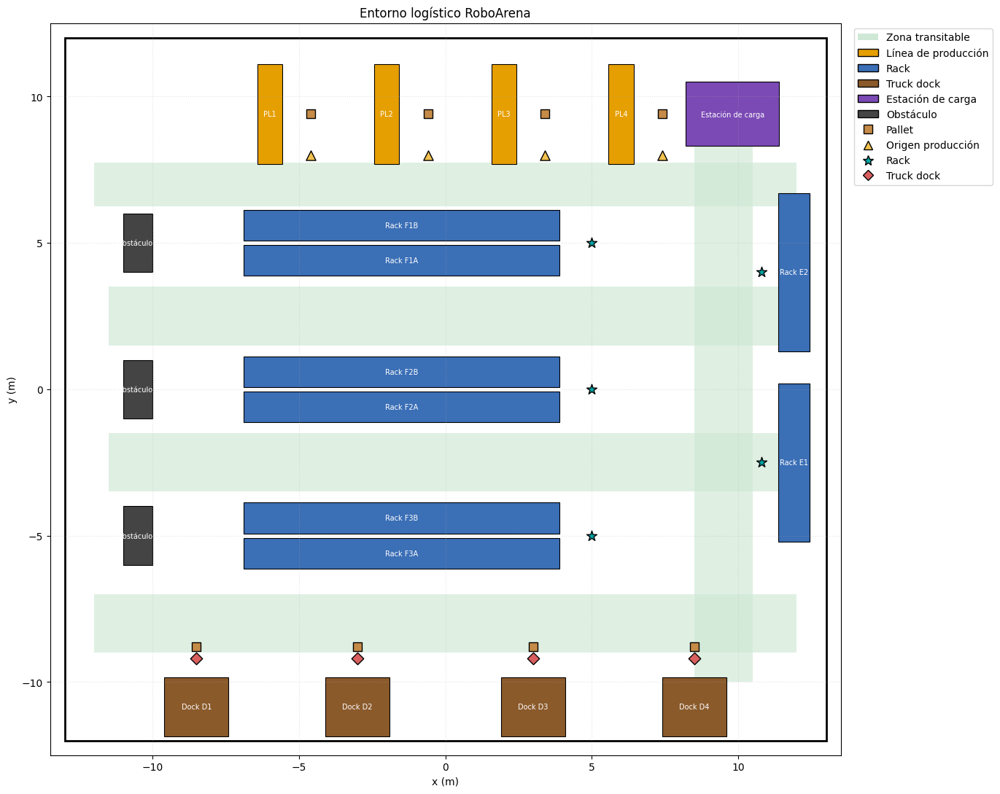

In [ ]:
# Dimensiones generales de la nave (m)
WAREHOUSE_WIDTH = 26.0
WAREHOUSE_HEIGHT = 24.0

X_MIN = -WAREHOUSE_WIDTH / 2
X_MAX =  WAREHOUSE_WIDTH / 2
Y_MIN = -WAREHOUSE_HEIGHT / 2
Y_MAX =  WAREHOUSE_HEIGHT / 2

# Posiciones principales
PRODUCTION_X = [-6.0, -2.0, 2.0, 6.0]
RACK_ROWS_Y = [5.0, 0.0, -5.0]
DOCK_X = [-8.5, -3.0, 3.0, 8.5]

def element(name, kind, x, y, w, h, traversable=False):
    return {
        "name": name,
        "type": kind,
        "x": float(x),
        "y": float(y),
        "w": float(w),
        "h": float(h),
        "traversable": bool(traversable)
    }

# Líneas de producción
production_lines = [
    element(f"PL{i+1}", "production", x, 9.4, 0.85, 3.4)
    for i, x in enumerate(PRODUCTION_X)
]

# Racks
racks = []
for i, y in enumerate(RACK_ROWS_Y, start=1):
    racks.append(element(f"Rack F{i}A", "rack", -1.5, y - 0.6, 10.8, 1.05))
    racks.append(element(f"Rack F{i}B", "rack", -1.5, y + 0.6, 10.8, 1.05))

racks += [
    element("Rack E1", "rack", 11.9, -2.5, 1.05, 5.4),
    element("Rack E2", "rack", 11.9,  4.0, 1.05, 5.4),
]

# Truck docks
truck_docks = [
    element(f"Dock D{i+1}", "dock", x, -10.85, 2.2, 2.0)
    for i, x in enumerate(DOCK_X)
]

# Estación de carga
charging_stations = [
    element("Estación de carga", "charging", 9.8, 9.4, 3.2, 2.2)
]

# Obstáculos
obstacles = [
    element("Obstáculo 1", "obstacle", -10.5, 5.0, 1.0, 2.0),
    element("Obstáculo 2", "obstacle", -10.5, 0.0, 1.0, 2.0),
    element("Obstáculo 3", "obstacle", -10.5, -5.0, 1.0, 2.0),
]

# Corredores / zonas transitables
corridors = [
    element("Pasillo norte", "corridor", 0.0, 7.0, 24.0, 1.5, True),
    element("Pasillo central 1", "corridor", 0.0, 2.5, 23.0, 2.0, True),
    element("Pasillo central 2", "corridor", 0.0, -2.5, 23.0, 2.0, True),
    element("Pasillo sur", "corridor", 0.0, -8.0, 24.0, 2.0, True),
    element("Pasillo este", "corridor", 9.5, 0.0, 2.0, 20.0, True),
]

# Posiciones destinadas a pallets
pallet_points = []

for i, x in enumerate(PRODUCTION_X, start=1):
    pallet_points.append({
        "name": f"Pallet PL{i}",
        "x": x + 1.4,
        "y": 9.4
    })

for i, x in enumerate(DOCK_X, start=1):
    pallet_points.append({
        "name": f"Pallet D{i}",
        "x": x,
        "y": -8.8
    })

rack_points = [
    {"name": "Rack F1", "x": 5.0, "y": 5.0},
    {"name": "Rack F2", "x": 5.0, "y": 0.0},
    {"name": "Rack F3", "x": 5.0, "y": -5.0},
    {"name": "Rack E1", "x": 10.8, "y": -2.5},
    {"name": "Rack E2", "x": 10.8, "y": 4.0},
]

production_points = [
    {"name": f"PL{i+1}", "x": x + 1.4, "y": 8.0}
    for i, x in enumerate(PRODUCTION_X)
]

dock_points = [
    {"name": f"D{i+1}", "x": x, "y": -9.2}
    for i, x in enumerate(DOCK_X)
]

import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle, Patch
from matplotlib.lines import Line2D

COLORS = {
    "production": "#e69f00",
    "rack": "#3b6fb6",
    "dock": "#8b5a2b",
    "charging": "#7b4ab5",
    "obstacle": "#444444",
    "corridor": "#cfe8d5"
}

fig, ax = plt.subplots(figsize=(14, 11))

# Fondo del entorno
ax.add_patch(Rectangle(
    (X_MIN, Y_MIN),
    WAREHOUSE_WIDTH,
    WAREHOUSE_HEIGHT,
    facecolor="white",
    edgecolor="black",
    linewidth=2
))

# Corredores transitables
for e in corridors:
    ax.add_patch(Rectangle(
        (e["x"] - e["w"]/2, e["y"] - e["h"]/2),
        e["w"], e["h"],
        facecolor=COLORS["corridor"],
        edgecolor="none",
        alpha=0.65
    ))

# Elementos físicos
for e in production_lines + racks + truck_docks + charging_stations + obstacles:
    ax.add_patch(Rectangle(
        (e["x"] - e["w"]/2, e["y"] - e["h"]/2),
        e["w"], e["h"],
        facecolor=COLORS[e["type"]],
        edgecolor="black",
        linewidth=0.8
    ))
    ax.text(
        e["x"], e["y"], e["name"],
        ha="center", va="center",
        fontsize=7, color="white"
    )

# Pallets
for p in pallet_points:
    ax.scatter(
        p["x"], p["y"],
        marker="s", s=65,
        color="#c58b47",
        edgecolor="black",
        zorder=5
    )

# Puntos de origen/destino
for p in production_points:
    ax.scatter(p["x"], p["y"], marker="^", s=90, color="#f2c14e", edgecolor="black", zorder=6)

for p in rack_points:
    ax.scatter(p["x"], p["y"], marker="*", s=110, color="#00a6a6", edgecolor="black", zorder=6)

for p in dock_points:
    ax.scatter(p["x"], p["y"], marker="D", s=70, color="#d95f5f", edgecolor="black", zorder=6)

ax.set_xlim(X_MIN - 0.5, X_MAX + 0.5)
ax.set_ylim(Y_MIN - 0.5, Y_MAX + 0.5)
ax.set_aspect("equal")
ax.set_xlabel("x (m)")
ax.set_ylabel("y (m)")
ax.set_title("Entorno logístico RoboArena")
ax.grid(True, linestyle=":", alpha=0.35)

legend_items = [
    Patch(facecolor=COLORS["corridor"], label="Zona transitable"),
    Patch(facecolor=COLORS["production"], edgecolor="black", label="Línea de producción"),
    Patch(facecolor=COLORS["rack"], edgecolor="black", label="Rack"),
    Patch(facecolor=COLORS["dock"], edgecolor="black", label="Truck dock"),
    Patch(facecolor=COLORS["charging"], edgecolor="black", label="Estación de carga"),
    Patch(facecolor=COLORS["obstacle"], edgecolor="black", label="Obstáculo"),
    Line2D([0], [0], marker="s", color="w", markerfacecolor="#c58b47",
           markeredgecolor="black", markersize=8, label="Pallet"),
    Line2D([0], [0], marker="^", color="w", markerfacecolor="#f2c14e",
           markeredgecolor="black", markersize=8, label="Origen producción"),
    Line2D([0], [0], marker="*", color="w", markerfacecolor="#00a6a6",
           markeredgecolor="black", markersize=10, label="Rack"),
    Line2D([0], [0], marker="D", color="w", markerfacecolor="#d95f5f",
           markeredgecolor="black", markersize=7, label="Truck dock"),
]

ax.legend(handles=legend_items, loc="upper left", bbox_to_anchor=(1.01, 1))
plt.tight_layout()
plt.savefig("roboarena_entorno_limpio.png", dpi=200, bbox_inches="tight")
plt.show()

## 7. Análisis breve

### 1. ¿Cómo representaron computacionalmente el entorno?
Representamos la nave como un plano de 26 × 24 metros con coordenadas `(x, y)`. Cada elemento tiene una posición, ancho, largo y tipo.

### 2. ¿Qué elementos incluyeron?
Incluimos líneas de producción, racks, truck docks, una estación de carga, posiciones para pallets, corredores transitables y obstáculos.

### 3. ¿Qué características personalizaron respecto al ejemplo mostrado en clase?
Personalizamos las dimensiones del espacio, la posición de los racks, las líneas de producción, los truck docks, la estación de carga, los pallets, los corredores y los obstáculos.

### 4. ¿Por qué eligieron esa distribución?
Elegimos esta distribución para separar las áreas de producción, almacenamiento y carga o descarga, dejando pasillos para circulación.

### 5. ¿Cómo representaron las zonas transitables y los obstáculos?
Las zonas transitables se representan como corredores y los obstáculos como rectángulos que no se pueden atravesar.

### 6. ¿Dónde se encuentran los posibles orígenes y destinos de los tres flujos logísticos?
El flujo Production Line → Rack / Truck Dock inicia en las líneas de producción y termina en racks o truck docks. El flujo Rack → Truck Dock inicia en los racks y termina en los truck docks. El flujo Truck Dock → Rack inicia en los truck docks y termina en los racks.

### 7. ¿Qué elementos de este entorno consideran que serán importantes cuando posteriormente se incorpore la lógica de los AGVs?
Serán importantes las coordenadas de origen y destino, los pasillos transitables, los obstáculos, los pallets, los racks, los truck docks y la estación de carga.


# M3. Sistema Multiagente de 6 apiladores Stacker en el entorno RoboArena
Luis Tonchez, Desiderio Ortegon, Ayhan Ben Halima, Sebastian Martinez, Julian Bustos

Esta segunda entrega extiende el entorno logístico personalizado desarrollado en M2 (secciones 1 a 7, arriba) incorporando una flota de **6 AGV autónomos** que operan sobre ese mismo entorno como un Sistema Multiagente (SMA).

Para mantener consistencia con el archivo de Unity del equipo, los seis agentes utilizan una sola referencia de vehículo: **`V4_Apilador_de_Stacks`** (`Assets/Prefabs/V4_Apilador_de_Stacks.prefab`). No se utilizan otros vehículos como agentes.

En esta etapa se conserva la comunicación, negociación, colaboración, batería, movimiento y ejecución de misiones desarrollados en M3, que sirven como base directa para M4.


## M3.1 Librerías adicionales

In [ ]:
import random
import heapq
import math
import matplotlib
import matplotlib.animation as animation
from IPython.display import HTML, display

random.seed(11)
matplotlib.rcParams['animation.embed_limit'] = 80  # MB, margen para la animación embebida

print("Librerías adicionales cargadas.")

Librerías adicionales cargadas.


## M3.2 Rejilla de navegación sobre el entorno M2

Para que los AGV respeten las principales áreas transitables y no transitables definidas en M2, construimos una
rejilla (grid) discreta de 1 m de resolución sobre la nave y aplicamos búsqueda de ruta A* (equivalente a distancia
Manhattan en una rejilla de 4 direcciones). Una celda es transitable si:

1. su centro cae dentro de un corredor (`traversable=True` en M2), o
2. está dentro de un radio de acercamiento (`ACCESS_RADIUS`) de un punto de interacción (líneas de producción,
   racks, docks, estación de carga, posiciones de pallet), esto permite que un AGV se "arrime" al punto exacto
   de recogida/entrega desde el corredor más cercano;

y nunca si cae dentro de un obstáculo, sin importar lo anterior (regla dura).

Esto no pretende ser un algoritmo de ruteo sofisticado (fuera de alcance de M3): la calidad del ruteo no se evalúa
en esta actividad. Lo importante es que el mecanismo de negociación decide qué AGV ejecuta una misión, mientras
que esta rejilla + A* solo decide cómo llega dicho AGV a su destino.

In [ ]:
GRID_RES = 1.0        # metros por celda
ACCESS_RADIUS = 2.0    # metros alrededor de puntos de interacción


def build_grid(x_min, x_max, y_min, y_max, corridors_, obstacles_, interaction_points, res=GRID_RES, access_radius=ACCESS_RADIUS):
    xs = np.arange(x_min, x_max + res, res)
    ys = np.arange(y_min, y_max + res, res)
    nx, ny = len(xs), len(ys)
    walkable = np.zeros((nx, ny), dtype=bool)
    for i, cx in enumerate(xs):
        for j, cy in enumerate(ys):
            ok = False
            for c in corridors_:
                if abs(cx - c["x"]) <= c["w"] / 2 and abs(cy - c["y"]) <= c["h"] / 2:
                    ok = True
                    break
            if not ok:
                for p in interaction_points:
                    if (cx - p["x"]) ** 2 + (cy - p["y"]) ** 2 <= access_radius ** 2:
                        ok = True
                        break
            if ok:
                for o in obstacles_:
                    if abs(cx - o["x"]) <= o["w"] / 2 and abs(cy - o["y"]) <= o["h"] / 2:
                        ok = False
                        break
            walkable[i, j] = ok
    return xs, ys, walkable


class GridNav:
    # Rejilla de navegación + búsqueda de ruta A* (4 direcciones ~ Manhattan).

    def __init__(self, x_min, x_max, y_min, y_max, corridors_, obstacles_, interaction_points,
                 res=GRID_RES, access_radius=ACCESS_RADIUS):
        self.res = res
        self.xs, self.ys, self.walkable = build_grid(
            x_min, x_max, y_min, y_max, corridors_, obstacles_, interaction_points, res, access_radius
        )
        self.nx, self.ny = len(self.xs), len(self.ys)

    def nearest_cell(self, x, y):
        i = int(np.clip(round((x - self.xs[0]) / self.res), 0, self.nx - 1))
        j = int(np.clip(round((y - self.ys[0]) / self.res), 0, self.ny - 1))
        if self.walkable[i, j]:
            return i, j
        best, best_d = None, None
        for r in range(1, max(self.nx, self.ny)):
            for di in range(-r, r + 1):
                for dj in range(-r, r + 1):
                    ii, jj = i + di, j + dj
                    if 0 <= ii < self.nx and 0 <= jj < self.ny and self.walkable[ii, jj]:
                        d = di * di + dj * dj
                        if best_d is None or d < best_d:
                            best_d, best = d, (ii, jj)
            if best is not None:
                return best
        return (i, j)

    def cell_to_xy(self, i, j):
        return float(self.xs[i]), float(self.ys[j])

    def astar(self, start_xy, goal_xy):
        start = self.nearest_cell(*start_xy)
        goal = self.nearest_cell(*goal_xy)
        if start == goal:
            return [self.cell_to_xy(*start)]

        def h(a, b):
            return abs(a[0] - b[0]) + abs(a[1] - b[1])

        open_set = [(h(start, goal), 0, start, None)]
        came_from, gscore, visited = {}, {start: 0}, set()
        neighbors = [(-1, 0), (1, 0), (0, -1), (0, 1)]
        while open_set:
            _, g, current, parent = heapq.heappop(open_set)
            if current in visited:
                continue
            visited.add(current)
            came_from[current] = parent
            if current == goal:
                path, node = [], current
                while node is not None:
                    path.append(node)
                    node = came_from[node]
                path.reverse()
                return [self.cell_to_xy(i, j) for (i, j) in path]
            for di, dj in neighbors:
                ni, nj = current[0] + di, current[1] + dj
                if 0 <= ni < self.nx and 0 <= nj < self.ny and self.walkable[ni, nj]:
                    ng = g + 1
                    if (ni, nj) not in gscore or ng < gscore[(ni, nj)]:
                        gscore[(ni, nj)] = ng
                        heapq.heappush(open_set, (ng + h((ni, nj), goal), ng, (ni, nj), current))
        return [start_xy, goal_xy]  # sin ruta -> línea recta de respaldo (no debería ocurrir)


charging_xy = (charging_stations[0]["x"], charging_stations[0]["y"])

interaction_points = (
    production_points + rack_points + dock_points + pallet_points
    + [{"name": "Charging", "x": charging_xy[0], "y": charging_xy[1]}]
)

nav = GridNav(X_MIN, X_MAX, Y_MIN, Y_MAX, corridors, obstacles, interaction_points)
print(f"Rejilla: {nav.nx} x {nav.ny} celdas ({GRID_RES} m/celda), transitables: {nav.walkable.sum()}")

Rejilla: 27 x 25 celdas (1.0 m/celda), transitables: 339


## M3.3 Posiciones de almacenamiento de pallets

Es importante distinguir el rack (infraestructura fija del almacén, ya definida en M2) de la posición de
almacenamiento de pallet (un slot puntual que puede estar ocupado o vacío). Generamos 3 posiciones de
almacenamiento por cada rack de M2 (`rack_points`), desplazadas a lo largo del rack.

In [ ]:
def build_storage_slots():
    slots = []
    horizontal_racks = {"Rack F1", "Rack F2", "Rack F3"}
    for rp in rack_points:
        is_horizontal = rp["name"] in horizontal_racks
        for k in range(3):
            offset = (k - 1) * 1.0
            if is_horizontal:
                slots.append({"slot_id": f"{rp['name']}-S{k+1}", "x": rp["x"] + offset, "y": rp["y"], "rack": rp["name"]})
            else:
                slots.append({"slot_id": f"{rp['name']}-S{k+1}", "x": rp["x"], "y": rp["y"] + offset, "rack": rp["name"]})
    return slots


STORAGE_SLOTS = build_storage_slots()
# las posiciones de almacenamiento también deben ser transitables/alcanzables por los AGV
nav = GridNav(X_MIN, X_MAX, Y_MIN, Y_MAX, corridors, obstacles, interaction_points + STORAGE_SLOTS)

slots_df = pd.DataFrame(STORAGE_SLOTS)
print("Posiciones de almacenamiento generadas:", len(STORAGE_SLOTS))
slots_df.head(9)

Posiciones de almacenamiento generadas: 15


,slot_id,x,y,rack
0,Rack F1-S1,4.0,5.0,Rack F1
1,Rack F1-S2,5.0,5.0,Rack F1
2,Rack F1-S3,6.0,5.0,Rack F1
3,Rack F2-S1,4.0,0.0,Rack F2
4,Rack F2-S2,5.0,0.0,Rack F2
5,Rack F2-S3,6.0,0.0,Rack F2
6,Rack F3-S1,4.0,-5.0,Rack F3
7,Rack F3-S2,5.0,-5.0,Rack F3
8,Rack F3-S3,6.0,-5.0,Rack F3


## M3.4 Modelo de datos: Pallet y Misión

**Pallet**: objeto físico transportable. Mantiene identificador, posición actual y estado
(`almacenado` → `esperando_recogida` → `reservado` → `en_transporte` → `entregado`).

**Mission** (misión de transporte): referencia al pallet, punto de recogida, punto de entrega, tipo de flujo
logístico (de los tres definidos en M2: Producción→Rack/Dock, Rack→Dock, Dock→Rack), prioridad y estado
(`pendiente` → `publicada` → `reservada` → `en_progreso` → `completada`).

In [ ]:
class Pallet:
    def __init__(self, pallet_id, x, y, home_slot=None):
        self.pallet_id = pallet_id
        self.x = x
        self.y = y
        self.home_slot = home_slot
        self.status = "almacenado"  # almacenado/esperando_recogida/reservado/en_transporte/entregado
        self.destination_label = None

    @property
    def position(self):
        return (self.x, self.y)


class Mission:
    _counter = 1

    def __init__(self, pallet, dropoff_xy, dropoff_label, flow_label, step, priority):
        self.mission_id = f"M{Mission._counter:02d}"
        Mission._counter += 1
        self.pallet_id = pallet.pallet_id
        self.pickup_xy = pallet.position
        self.dropoff_xy = dropoff_xy
        self.dropoff_label = dropoff_label
        self.flow_label = flow_label
        self.priority = priority
        self.status = "pendiente"
        self.created_step = step
        self.assigned_agv = None


print("Clases Pallet y Mission definidas.")

Clases Pallet y Mission definidas.


## M3.5 Comunicación: mensajes y bus compartido (blackboard)

La comunicación se representa computacionalmente mediante una clase `Message` (quién envía, quién recibe (`ALL`
para difusión/broadcast), tipo de mensaje y contenido) y una clase `MessageBus` que actúa como tablero
compartido: todos los AGV pueden "ver" los mensajes que otros agentes publican (por ejemplo, las pujas de una
negociación), igual que en un blackboard system.

Tipos de mensaje usados:

| Mensaje | Emisor | Receptor | Contenido | Cómo lo usa el receptor |
|---|---|---|---|---|
| `MISSION_PUBLISHED` | Mission Manager | todos los AGV | misión, flujo, prioridad | cada AGV evalúa si le conviene pujar |
| `BID` | AGV | todos (blackboard) | misión, valor de la puja | cada AGV compara su puja contra las demás para autoseleccionarse |
| `NOT_AVAILABLE` | AGV | todos | misión, motivo (ocupado / batería baja) | informa a los demás que ese AGV no compite |
| `MISSION_ACCEPTED` | AGV ganador | todos | misión | los demás AGV descartan esa misión de sus candidatas |
| `ARRIVED_PICKUP` | AGV | Mission Manager | misión, pallet | registro de progreso |
| `PALLET_LOADED` | AGV | todos | pallet, destino | informa que el pallet ya está en tránsito |
| `MISSION_COMPLETED` | AGV | Mission Manager | misión | Mission Manager cierra la misión |
| `BATTERY_LOW` | AGV | todos | nivel de batería | informa que ese AGV dejará de pujar y va a recargar |
| `CHARGE_DONE` | AGV | todos | nivel de batería | informa que ese AGV vuelve a estar disponible |

In [ ]:
NARRATIVE = {
    "MISSION_PUBLISHED": lambda c: f"Misión {c['mission_id']} publicada ({c['flow_label']}, prioridad {c['priority']})",
    "BID": lambda c: f"{c['agv_id']} puja por {c['mission_id']}: {c['bid']}",
    "NOT_AVAILABLE": lambda c: f"{c['agv_id']} no disponible para {c['mission_id']} ({c['reason']})",
    "MISSION_ACCEPTED": lambda c: f"{c['agv_id']} acepta la {c['mission_id']}",
    "ARRIVED_PICKUP": lambda c: f"{c['agv_id']} llegó al pallet {c['pallet_id']}",
    "PALLET_LOADED": lambda c: f"{c['agv_id']} transportando {c['pallet_id']} -> {c['dropoff_label']}",
    "MISSION_COMPLETED": lambda c: f"{c['agv_id']} completó la {c['mission_id']}",
    "BATTERY_LOW": lambda c: f"{c['agv_id']} batería baja ({c['battery']:.0f}%), regresa a recargar",
    "CHARGE_DONE": lambda c: f"{c['agv_id']} recarga completa ({c['battery']:.0f}%), disponible",
}


class Message:
    def __init__(self, step, sender, receiver, mtype, content):
        self.step, self.sender, self.receiver = step, sender, receiver
        self.mtype, self.content = mtype, content

    def __str__(self):
        fn = NARRATIVE.get(self.mtype)
        text = fn(self.content) if fn else f"{self.sender}->{self.receiver}: {self.mtype} {self.content}"
        return f"[t={self.step:03d}] {text}"


class MessageBus:
    def __init__(self):
        self.messages = []

    def broadcast(self, sender, mtype, content, step):
        content = dict(content); content.setdefault("agv_id", sender)
        msg = Message(step, sender, "ALL", mtype, content)
        self.messages.append(msg)
        return msg

    def send(self, sender, receiver, mtype, content, step):
        content = dict(content); content.setdefault("agv_id", sender)
        msg = Message(step, sender, receiver, mtype, content)
        self.messages.append(msg)
        return msg

    def as_text(self):
        return [str(m) for m in self.messages]


print("Mecanismo de comunicación (Message / MessageBus) definido.")

Mecanismo de comunicación (Message / MessageBus) definido.


## M3.6 Mission Manager (rol limitado)

El `MissionManager` solo administra el ciclo de vida de las misiones: mantiene la lista de misiones
pendientes/abiertas, publica nuevas misiones (broadcast) y registra aceptaciones y finalizaciones. No decide
qué AGV ejecuta cada misión, esa decisión surge de la negociación entre los propios AGV (sección M3.7).

In [ ]:
class MissionManager:
    def __init__(self, bus_):
        self.bus = bus_
        self.open_missions = []          # publicadas, aún no reservadas por ningún AGV
        self.in_progress_missions = []
        self.completed_missions = []

    def publish(self, mission, step):
        mission.status = "publicada"
        self.open_missions.append(mission)
        self.bus.broadcast(
            "MissionManager", "MISSION_PUBLISHED",
            {"mission_id": mission.mission_id, "flow_label": mission.flow_label, "priority": mission.priority},
            step,
        )

    def register_acceptance(self, mission):
        if mission in self.open_missions:
            self.open_missions.remove(mission)
        self.in_progress_missions.append(mission)

    def register_completion(self, mission):
        if mission in self.in_progress_missions:
            self.in_progress_missions.remove(mission)
        self.completed_missions.append(mission)


print("Mission Manager (rol limitado) definido.")

Mission Manager (rol limitado) definido.


## M3.7 Agente AGV: estado interno, batería, negociación y colaboración

**Estado interno de cada AGV** (mínimo requerido, más algunos campos adicionales):

- `agv_id`: identificador único (`AGV-1`, `AGV-2`, ...).
- `x, y`: posición actual.
- `state`: `IDLE`, `MOVING_TO_PICKUP`, `MOVING_TO_DROPOFF`, `RETURNING_TO_CHARGE`, `CHARGING`.
- `battery`: nivel de batería (0-100%).
- `carried_pallet`: id del pallet transportado (o `None`).
- `current_mission`: id de la misión actual (o `None`).
- `missions_completed`, `distance_traveled`: métricas acumuladas.

**Negociación (bidding).** Cuando el Mission Manager publica una misión, cada AGV *disponible*
(`state == IDLE` y `battery` por encima del umbral de batería baja) calcula su propia puja con la regla de
utilidad:

$$\text{puja} = 100 - 1.8 \cdot d_{Manhattan}(AGV, pickup) + 0.2 \cdot bateria + 10 \cdot prioridad$$

Es decir: a menor distancia al punto de recogida, mayor batería disponible y mayor prioridad de la misión,
mayor la puja. Cada AGV publica su puja en el tablero compartido (`MessageBus`). La resolución sigue una
variante simplificada del Contract Net Protocol: cada AGV que participó compara su propia puja contra todas
las pujas visibles en el tablero (método `wins_negotiation`) y se autoselecciona si la suya es la máxima
(con desempate determinístico por id de AGV). El AGV ganador reserva la misión de inmediato y difunde
`MISSION_ACCEPTED`; los demás simplemente descartan esa misión, el Mission Manager no interviene en la elección.

**Colaboración básica** (todas verificables en el log de la sección M3.10):

- Un AGV ocupado (`state != IDLE`) nunca puja → no puede competir por una nueva misión mientras ejecuta otra.
- Un AGV con batería baja tampoco puja, y en cambio se dirige a la estación de carga → nunca acepta una misión
  si necesita recargarse.
- En cuanto un AGV reserva una misión, ésta se retira de `open_missions` → ningún otro AGV puede aceptarla después
  (evita doble aceptación).
- Si un AGV está ocupado o con batería baja, los demás AGV disponibles pujan igualmente por la misión publicada →
  un AGV disponible puede tomar una misión que otro no puede atender.
- Cada cambio de disponibilidad (batería baja, recarga completa, misión aceptada/],completada) se comunica por
  broadcast, de forma que el resto de agentes conoce el estado actualizado del sistema.

In [ ]:
LOW_BATTERY_THRESHOLD = 25.0     # bajo este nivel, el AGV deja de pujar y regresa a recargar
CHARGE_FULL_LEVEL = 95.0
BATTERY_DRAIN_PER_CELL = 0.55    # % de batería por celda de rejilla recorrida
BATTERY_CHARGE_PER_STEP = 10.0   # % de batería recuperada por paso en la estación de carga


def manhattan(a, b):
    return abs(a[0] - b[0]) + abs(a[1] - b[1])


class AGV:
    def __init__(self, agv_id, start_xy, nav_, charging_xy_, battery=100.0, vehicle_model="V4_Apilador_de_Stacks"):
        self.agv_id = agv_id
        self.vehicle_model = vehicle_model
        self.x, self.y = start_xy
        self.nav = nav_
        self.charging_xy = charging_xy_
        self.battery = battery
        self.state = "IDLE"
        self.path = []
        self.carried_pallet = None
        self.current_mission = None
        self.missions_completed = 0
        self.distance_traveled = 0.0

    @property
    def position(self):
        return (self.x, self.y)

    # negociación
    def is_available_for_bid(self):
        return self.state == "IDLE" and self.battery > LOW_BATTERY_THRESHOLD

    def compute_bid(self, mission):
        dist = manhattan(self.position, mission.pickup_xy)
        utility = 100.0 - 1.8 * dist + 0.2 * self.battery + mission.priority * 10.0
        return round(utility, 1)

    def wins_negotiation(self, bids):
        # Cada AGV decide por sí mismo, comparando su puja contra el tablero
        # compartido de pujas (bids), si es el ganador (mayor puja; empate -> id menor).
        ranked = sorted(bids.items(), key=lambda kv: (-kv[1], kv[0]))
        return ranked[0][0] == self.agv_id

    def accept_mission(self, mission, pallets_, bus_, mission_manager_, step):
        self.state = "MOVING_TO_PICKUP"
        self.current_mission = mission.mission_id
        mission.status = "reservada"
        mission.assigned_agv = self.agv_id
        pallets_[mission.pallet_id].status = "reservado"
        mission_manager_.register_acceptance(mission)
        self._set_path_to(mission.pickup_xy)
        bus_.broadcast("MissionManager", "MISSION_ACCEPTED", {"agv_id": self.agv_id, "mission_id": mission.mission_id}, step)

    #movimiento
    def _set_path_to(self, target_xy):
        full = self.nav.astar(self.position, target_xy)
        self.path = full[1:] if len(full) > 1 else []

    def _advance(self):
        if not self.path:
            return False
        nxt = self.path.pop(0)
        d = manhattan(self.position, nxt)
        self.distance_traveled += d
        self.battery = max(0.0, self.battery - BATTERY_DRAIN_PER_CELL * d)
        self.x, self.y = nxt
        return True

    #actualización por paso de simulación
    def update(self, step, pallets_, missions_by_id_, bus_, mission_manager_):
        if self.state == "IDLE":
            if self.battery <= LOW_BATTERY_THRESHOLD:
                self.state = "RETURNING_TO_CHARGE"
                self._set_path_to(self.charging_xy)
                bus_.broadcast(self.agv_id, "BATTERY_LOW", {"battery": self.battery}, step)
            return

        if self.state == "MOVING_TO_PICKUP":
            moved = self._advance()
            if not moved:
                mission = missions_by_id_[self.current_mission]
                pallet = pallets_[mission.pallet_id]
                bus_.send(self.agv_id, "MissionManager", "ARRIVED_PICKUP",
                          {"pallet_id": pallet.pallet_id, "mission_id": mission.mission_id}, step)
                pallet.status = "en_transporte"
                self.carried_pallet = pallet.pallet_id
                mission.status = "en_progreso"
                self.state = "MOVING_TO_DROPOFF"
                self._set_path_to(mission.dropoff_xy)
                bus_.broadcast(self.agv_id, "PALLET_LOADED",
                               {"pallet_id": pallet.pallet_id, "dropoff_label": mission.dropoff_label}, step)
            return

        if self.state == "MOVING_TO_DROPOFF":
            mission = missions_by_id_[self.current_mission]
            pallet = pallets_[mission.pallet_id]
            moved = self._advance()
            if self.carried_pallet:
                pallet.x, pallet.y = self.position
            if not moved:
                pallet.status = "entregado"
                mission.status = "completada"
                mission_manager_.register_completion(mission)
                self.missions_completed += 1
                self.carried_pallet = None
                self.current_mission = None
                bus_.broadcast(self.agv_id, "MISSION_COMPLETED", {"mission_id": mission.mission_id}, step)
                if self.battery <= LOW_BATTERY_THRESHOLD:
                    self.state = "RETURNING_TO_CHARGE"
                    self._set_path_to(self.charging_xy)
                    bus_.broadcast(self.agv_id, "BATTERY_LOW", {"battery": self.battery}, step)
                else:
                    self.state = "IDLE"
            return

        if self.state == "RETURNING_TO_CHARGE":
            moved = self._advance()
            if not moved:
                self.state = "CHARGING"
            return

        if self.state == "CHARGING":
            self.battery = min(100.0, self.battery + BATTERY_CHARGE_PER_STEP)
            if self.battery >= CHARGE_FULL_LEVEL:
                self.state = "IDLE"
                bus_.broadcast(self.agv_id, "CHARGE_DONE", {"battery": self.battery}, step)
            return


print("Clase AGV (agente autónomo) definida.")

Clase AGV (agente autónomo) definida.


## M3.8 Configuración de la simulación

Se crean **6 AGV**, todos representados por el mismo modelo de Unity **`V4_Apilador_de_Stacks`**, con posiciones iniciales e identificadores distintos y niveles de batería distintos. También se crea un lote inicial de pallets almacenados y un generador dinámico de misiones que cubre los tres flujos logísticos definidos en M2 (Producción→Rack, Rack→Dock, Dock→Rack).

Las misiones se publican en distintos pasos de tiempo para provocar negociación y colaboración entre los agentes.


In [ ]:
N_AGVS = 6
N_STEPS = 140
INITIAL_STORED_PALLETS = 6

# pallets iniciales, almacenados en posiciones de rack
pallets = {}
occupied_slots = set()
slot_pool = STORAGE_SLOTS.copy()
random.shuffle(slot_pool)

pallet_counter = 1
for _ in range(INITIAL_STORED_PALLETS):
    slot = slot_pool.pop()
    occupied_slots.add(slot["slot_id"])
    pid = f"P{pallet_counter:02d}"
    pallet_counter += 1
    pallets[pid] = Pallet(pid, slot["x"], slot["y"], home_slot=slot)

# flota de AGV
start_positions = [
    (8.0, 7.0),
    (10.0, 7.0),
    (-8.0, -8.0),
    (-3.0, -8.0),
    (3.0, -8.0),
    (8.0, -8.0),
]
battery_init = [95.0, 84.0, 72.0, 61.0, 50.0, 40.0]
agvs = [
    AGV(f"AGV-{i+1}", start_positions[i % len(start_positions)], nav, charging_xy, battery=battery_init[i % len(battery_init)])
    for i in range(N_AGVS)
]

bus = MessageBus()
mission_manager = MissionManager(bus)
missions_by_id = {}


def free_slot():
    free = [s for s in STORAGE_SLOTS if s["slot_id"] not in occupied_slots]
    return random.choice(free) if free else None


def new_pallet_id():
    global pallet_counter
    pid = f"P{pallet_counter:02d}"
    pallet_counter += 1
    return pid


def spawn_mission(step, flow_type):
    priority = random.choice([1, 1, 2, 2, 3])
    if flow_type == "rack_to_dock":
        candidates = [p for p in pallets.values() if p.status == "almacenado"]
        if not candidates:
            return None
        pallet = random.choice(candidates)
        dock = random.choice(dock_points)
        if pallet.home_slot:
            occupied_slots.discard(pallet.home_slot["slot_id"])
        pallet.status = "esperando_recogida"
        pallet.destination_label = dock["name"]
        mission = Mission(pallet, (dock["x"], dock["y"]), f"Dock {dock['name']}", "Rack -> Truck Dock", step, priority)
    elif flow_type == "production_to_rack":
        slot = free_slot()
        if slot is None:
            return None
        occupied_slots.add(slot["slot_id"])
        pp = random.choice(production_points)
        pid = new_pallet_id()
        pallet = Pallet(pid, pp["x"], pp["y"])
        pallet.status = "esperando_recogida"
        pallet.destination_label = slot["slot_id"]
        pallet.home_slot = slot
        pallets[pid] = pallet
        mission = Mission(pallet, (slot["x"], slot["y"]), f"Rack {slot['slot_id']}", "Producción -> Rack", step, priority)
    else:  # dock_to_rack
        slot = free_slot()
        if slot is None:
            return None
        occupied_slots.add(slot["slot_id"])
        dp = random.choice(dock_points)
        pid = new_pallet_id()
        pallet = Pallet(pid, dp["x"], dp["y"])
        pallet.status = "esperando_recogida"
        pallet.destination_label = slot["slot_id"]
        pallet.home_slot = slot
        pallets[pid] = pallet
        mission = Mission(pallet, (slot["x"], slot["y"]), f"Rack {slot['slot_id']}", "Truck Dock -> Rack", step, priority)
    missions_by_id[mission.mission_id] = mission
    return mission


MISSION_SCHEDULE = [
    (0, "rack_to_dock"), (0, "rack_to_dock"), (0, "production_to_rack"),
    (10, "dock_to_rack"), (14, "rack_to_dock"),
    (22, "production_to_rack"), (28, "dock_to_rack"),
    (36, "rack_to_dock"), (44, "production_to_rack"),
    (52, "dock_to_rack"), (60, "rack_to_dock"),
]

print(f"{N_AGVS} AGV creados: {[a.agv_id for a in agvs]}")
print(f"{len(pallets)} pallets iniciales almacenados.")
print(f"{len(MISSION_SCHEDULE)} misiones programadas a lo largo de {N_STEPS} pasos.")

6 AGV creados: ['AGV-1', 'AGV-2', 'AGV-3', 'AGV-4', 'AGV-5', 'AGV-6']
6 pallets iniciales almacenados.
11 misiones programadas a lo largo de 140 pasos.


## M3.9 Bucle principal de simulación

En cada paso de tiempo:

1. Se publican las misiones programadas para ese paso (Mission Manager → broadcast).
2. Para cada misión abierta, cada AGV disponible calcula y publica su puja (o informa que no está disponible);
   cada AGV compara su puja contra el tablero compartido y el que tiene la mejor puja se autoasigna la misión
   (negociación decentralizada, no hay asignación central).
3. Cada AGV actualiza su propio estado (movimiento un paso de rejilla, consumo/recarga de batería, recogida y
   entrega de pallets).
4. Se guarda una "fotografía" (frame) del estado completo del sistema, usada después para la animación y las
   métricas.

In [ ]:
frames = []

for step in range(N_STEPS):
    # publicar misiones programadas para este paso
    for sched_step, flow_type in MISSION_SCHEDULE:
        if sched_step == step:
            mission = spawn_mission(step, flow_type)
            if mission is not None:
                mission_manager.publish(mission, step)

    # ronda de negociación para cada misión abierta (publicada, sin reservar)
    for mission in list(mission_manager.open_missions):
        bids = {}
        for agv in agvs:
            if agv.is_available_for_bid():
                b = agv.compute_bid(mission)
                bids[agv.agv_id] = b
                bus.broadcast(agv.agv_id, "BID", {"mission_id": mission.mission_id, "bid": b}, step)
            else:
                reason = "batería baja" if agv.battery <= LOW_BATTERY_THRESHOLD else "ocupado"
                bus.broadcast(agv.agv_id, "NOT_AVAILABLE", {"mission_id": mission.mission_id, "reason": reason}, step)
        if bids:
            for agv in agvs:
                if agv.agv_id in bids and agv.wins_negotiation(bids):
                    agv.accept_mission(mission, pallets, bus, mission_manager, step)
                    break

    # actualizar cada AGV (movimiento, batería, entregas)
    for agv in agvs:
        agv.update(step, pallets, missions_by_id, bus, mission_manager)

    # registrar fotograma
    frames.append({
        "step": step,
        "agvs": [
            {"id": a.agv_id, "x": a.x, "y": a.y, "state": a.state, "battery": a.battery,
             "carried_pallet": a.carried_pallet, "missions_completed": a.missions_completed,
             "distance": a.distance_traveled}
            for a in agvs
        ],
        "pallets": [{"id": p.pallet_id, "x": p.x, "y": p.y, "status": p.status} for p in pallets.values()],
        "missions_completed": len(mission_manager.completed_missions),
        "missions_pending": len(mission_manager.open_missions) + len(mission_manager.in_progress_missions),
    })

print(f"Simulación terminada: {N_STEPS} pasos.")
print(f"Misiones totales creadas : {len(missions_by_id)}")
print(f"Misiones completadas     : {len(mission_manager.completed_missions)}")
print(f"Misiones abiertas (sin negociar aún): {len(mission_manager.open_missions)}")
print(f"Misiones en progreso al final       : {len(mission_manager.in_progress_missions)}")
print(f"Mensajes intercambiados en total    : {len(bus.messages)}")

Simulación terminada: 140 pasos.
Misiones totales creadas : 11
Misiones completadas     : 11
Misiones abiertas (sin negociar aún): 0
Misiones en progreso al final       : 0
Mensajes intercambiados en total    : 125


## M3.10 Evidencia de comunicación y negociación

A continuación se muestra el log completo de eventos (comunicación + negociación) tal como ocurrieron, en el
mismo estilo sugerido en el enunciado (`AGV-x puja: valor`, `AGV-x no disponible`, `AGV-x acepta la Misión`, etc.),
seguido de un acercamiento a una misión específica y a un ciclo completo de batería baja → recarga → disponible.

In [ ]:
log_lines = bus.as_text()

print(f"Log completo: {len(log_lines)} mensajes. Primeros 35:\n")
for line in log_lines[:35]:
    print(line)

Log completo: 125 mensajes. Primeros 35:

[t=000] Misión M01 publicada (Rack -> Truck Dock, prioridad 2)
[t=000] Misión M02 publicada (Rack -> Truck Dock, prioridad 3)
[t=000] Misión M03 publicada (Producción -> Rack, prioridad 2)
[t=000] AGV-1 puja por M01: 128.6
[t=000] AGV-2 puja por M01: 130.0
[t=000] AGV-3 puja por M01: 79.0
[t=000] AGV-4 puja por M01: 85.8
[t=000] AGV-5 puja por M01: 94.4
[t=000] AGV-6 puja por M01: 101.4
[t=000] AGV-2 acepta la M01
[t=000] AGV-1 puja por M02: 122.0
[t=000] AGV-2 no disponible para M02 (ocupado)
[t=000] AGV-3 puja por M02: 115.6
[t=000] AGV-4 puja por M02: 122.4
[t=000] AGV-5 puja por M02: 131.0
[t=000] AGV-6 puja por M02: 127.2
[t=000] AGV-5 acepta la M02
[t=000] AGV-1 puja por M03: 121.7
[t=000] AGV-2 no disponible para M03 (ocupado)
[t=000] AGV-3 puja por M03: 92.3
[t=000] AGV-4 puja por M03: 99.1
[t=000] AGV-5 no disponible para M03 (ocupado)
[t=000] AGV-6 puja por M03: 83.7
[t=000] AGV-1 acepta la M03
[t=004] AGV-2 llegó al pallet P02
[t=004

In [ ]:
# Negociación completa de una misión concreta (varios AGV pujando / no disponibles)
target_mission = "M02"
print(f"--- Negociación y ejecución de la {target_mission} ---")
for m in bus.messages:
    if m.content.get("mission_id") == target_mission or (m.mtype == "MISSION_COMPLETED" and m.content.get("mission_id") == target_mission):
        print(m)

--- Negociación y ejecución de la M02 ---
[t=000] Misión M02 publicada (Rack -> Truck Dock, prioridad 3)
[t=000] AGV-1 puja por M02: 122.0
[t=000] AGV-2 no disponible para M02 (ocupado)
[t=000] AGV-3 puja por M02: 115.6
[t=000] AGV-4 puja por M02: 122.4
[t=000] AGV-5 puja por M02: 131.0
[t=000] AGV-6 puja por M02: 127.2
[t=000] AGV-5 acepta la M02
[t=005] AGV-5 llegó al pallet P01
[t=014] AGV-5 completó la M02


In [ ]:
# Evidencia de colaboración por batería: ciclo batería baja -> recarga -> disponible
print("--- Eventos de batería baja / recarga completa ---")
for m in bus.messages:
    if m.mtype in ("BATTERY_LOW", "CHARGE_DONE"):
        print(m)

--- Eventos de batería baja / recarga completa ---
[t=080] AGV-5 batería baja (23%), regresa a recargar
[t=094] AGV-5 recarga completa (100%), disponible
[t=097] AGV-6 batería baja (10%), regresa a recargar
[t=133] AGV-6 recarga completa (100%), disponible


## M3.11 Animación del almacén

La animación muestra el almacén de M2 con los **6 apiladores Stacker** desplazándose mientras ejecutan misiones. El panel lateral muestra, para cada agente, su identificador, estado actual, nivel de batería y pallet transportado, además del paso de simulación y el conteo de misiones.

La representación 2D usa un marcador estilizado de apilador; no se introduce ningún otro tipo de vehículo.


In [ ]:
from matplotlib.path import Path as MplPath

STACKER_MARKER_M3 = MplPath([
    (-1.0, -0.65), (0.45, -0.65), (0.45, -0.25),
    (1.0, -0.25), (1.0, 0.25), (0.45, 0.25),
    (0.45, 0.65), (-1.0, 0.65), (-1.0, -0.65)
])

PALLET_COLORS = {
    "almacenado": "#8d99ae",
    "esperando_recogida": "#e07a5f",
    "reservado": "#f2cc8f",
    "en_transporte": "#3d5a80",
    "entregado": "#2a9d8f",
}
AGV_COLORS = ["#d62828", "#118ab2", "#7209b7", "#2a9d8f", "#e76f51", "#457b9d"]

ANIM_SUBSAMPLE = 3  # usar 1 de cada 3 fotogramas para mantener la animación ligera
anim_frames = frames[::ANIM_SUBSAMPLE]

fig_a, (ax_a, ax_info) = plt.subplots(1, 2, figsize=(11.5, 6.4), dpi=80, gridspec_kw={"width_ratios": [3, 1.15]})
ax_info.axis("off")

ax_a.add_patch(Rectangle((X_MIN, Y_MIN), WAREHOUSE_WIDTH, WAREHOUSE_HEIGHT, facecolor="white", edgecolor="black", linewidth=2))
for e in corridors:
    ax_a.add_patch(Rectangle((e["x"] - e["w"] / 2, e["y"] - e["h"] / 2), e["w"], e["h"],
                              facecolor=COLORS["corridor"], edgecolor="none", alpha=0.6, zorder=0))
for e in production_lines + racks + truck_docks + charging_stations + obstacles:
    ax_a.add_patch(Rectangle((e["x"] - e["w"] / 2, e["y"] - e["h"] / 2), e["w"], e["h"],
                              facecolor=COLORS[e["type"]], edgecolor="black", linewidth=0.6, zorder=1))
    ax_a.text(e["x"], e["y"], e["name"], ha="center", va="center", fontsize=5, color="white", zorder=2)
ax_a.set_xlim(X_MIN - 0.5, X_MAX + 0.5)
ax_a.set_ylim(Y_MIN - 0.5, Y_MAX + 0.5)
ax_a.set_aspect("equal")
ax_a.set_title("RoboArena — 6 apiladores Stacker (M3)")

legend_items = [
    Patch(facecolor=COLORS["corridor"], label="Zona transitable"),
    Patch(facecolor=COLORS["obstacle"], edgecolor="black", label="Obstáculo"),
    Line2D([0], [0], marker=STACKER_MARKER_M3, color="w", markerfacecolor="#777777", markeredgecolor="black", markersize=9, label="Apilador Stacker"),
    Line2D([0], [0], marker="s", color="w", markerfacecolor=PALLET_COLORS["almacenado"], markeredgecolor="black", markersize=7, label="Pallet almacenado"),
    Line2D([0], [0], marker="s", color="w", markerfacecolor=PALLET_COLORS["esperando_recogida"], markeredgecolor="black", markersize=7, label="Pallet esperando"),
    Line2D([0], [0], marker="s", color="w", markerfacecolor=PALLET_COLORS["en_transporte"], markeredgecolor="black", markersize=7, label="Pallet en tránsito"),
    Line2D([0], [0], marker="s", color="w", markerfacecolor=PALLET_COLORS["entregado"], markeredgecolor="black", markersize=7, label="Pallet entregado"),
]
ax_a.legend(handles=legend_items, loc="upper left", bbox_to_anchor=(1.01, 1.0), fontsize=6.5)

pallet_scat = ax_a.scatter([], [], s=60, marker="s", edgecolor="black", zorder=5)
agv_scat = ax_a.scatter([], [], s=230, marker=STACKER_MARKER_M3, edgecolor="black", linewidth=1.3, zorder=6)
agv_labels = [ax_a.text(0, 0, "", fontsize=6, ha="center", va="center", color="white", weight="bold", zorder=7) for _ in range(N_AGVS)]
info_txt = ax_info.text(0.0, 1.0, "", family="monospace", fontsize=7.6, va="top", transform=ax_info.transAxes)


def fmt_frame(fr):
    lines = [f"Paso: {fr['step']:03d}", f"Misiones completadas: {fr['missions_completed']}",
             f"Misiones pendientes: {fr['missions_pending']}", ""]
    for a in fr["agvs"]:
        lines.append(f"{a['id']}  [{a['state']}]")
        lines.append(f"  batería: {a['battery']:.0f}%   pallet: {a['carried_pallet'] or '-'}")
        lines.append(f"  misiones OK: {a['missions_completed']}")
        lines.append("")
    return "\n".join(lines)


def update_anim(i):
    fr = anim_frames[i]
    pxy = [[p["x"], p["y"]] for p in fr["pallets"]]
    if pxy:
        pallet_scat.set_offsets(pxy)
        pallet_scat.set_color([PALLET_COLORS[p["status"]] for p in fr["pallets"]])
    axy = [[a["x"], a["y"]] for a in fr["agvs"]]
    agv_scat.set_offsets(axy)
    agv_scat.set_color([AGV_COLORS[j % len(AGV_COLORS)] for j in range(len(fr["agvs"]))])
    for j, a in enumerate(fr["agvs"]):
        agv_labels[j].set_position((a["x"], a["y"]))
        agv_labels[j].set_text(a["id"].split("-")[1])
    info_txt.set_text(fmt_frame(fr))
    return [pallet_scat, agv_scat, info_txt] + agv_labels


ani = animation.FuncAnimation(fig_a, update_anim, frames=len(anim_frames), interval=250, blit=False)
html_anim = HTML(ani.to_jshtml())
plt.close(fig_a)
display(html_anim)

## M3.12 Resultados básicos de la simulación

In [ ]:
results_rows = []
for a in agvs:
    results_rows.append({
        "AGV": a.agv_id,
        "Misiones completadas": a.missions_completed,
        "Distancia recorrida (m)": round(a.distance_traveled, 1),
        "Batería final (%)": round(a.battery, 1),
        "Estado final": a.state,
    })
results_df = pd.DataFrame(results_rows)

print(f"Total de misiones completadas: {len(mission_manager.completed_missions)} / {len(missions_by_id)} creadas")
print(f"Misiones aún en progreso al finalizar la simulación: {len(mission_manager.in_progress_missions)}")
results_df

Total de misiones completadas: 11 / 11 creadas
Misiones aún en progreso al finalizar la simulación: 0


,AGV,Misiones completadas,Distancia recorrida (m),Batería final (%),Estado final
0,AGV-1,2,55.0,64.8,IDLE
1,AGV-2,1,37.0,63.7,IDLE
2,AGV-3,2,69.0,34.1,IDLE
3,AGV-4,1,56.0,30.2,IDLE
4,AGV-5,3,54.0,100.0,IDLE
5,AGV-6,2,79.0,100.0,IDLE


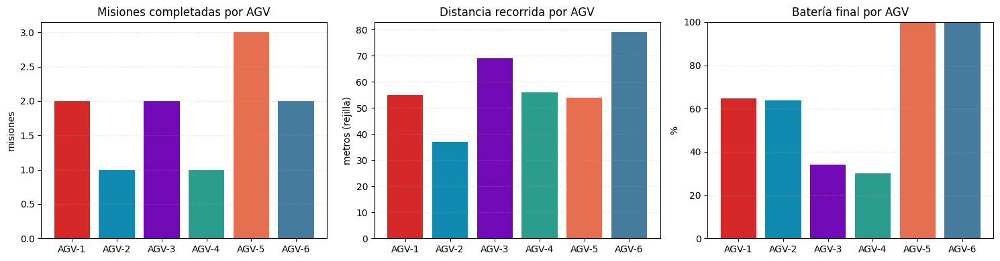

In [ ]:
fig_r, axes_r = plt.subplots(1, 3, figsize=(15, 4))

axes_r[0].bar(results_df["AGV"], results_df["Misiones completadas"], color=AGV_COLORS[:N_AGVS])
axes_r[0].set_title("Misiones completadas por AGV")
axes_r[0].set_ylabel("misiones")

axes_r[1].bar(results_df["AGV"], results_df["Distancia recorrida (m)"], color=AGV_COLORS[:N_AGVS])
axes_r[1].set_title("Distancia recorrida por AGV")
axes_r[1].set_ylabel("metros (rejilla)")

axes_r[2].bar(results_df["AGV"], results_df["Batería final (%)"], color=AGV_COLORS[:N_AGVS])
axes_r[2].set_title("Batería final por AGV")
axes_r[2].set_ylabel("%")
axes_r[2].set_ylim(0, 100)

for ax_ in axes_r:
    ax_.grid(True, axis="y", linestyle=":", alpha=0.4)

plt.tight_layout()
plt.savefig("roboarena_m3_resultados.png", dpi=150, bbox_inches="tight")
plt.show()

## M3.13 Análisis breve (M3)

**1. ¿Cómo representaron cada AGV como un agente autónomo?**
Cada uno de los 6 apiladores Stacker es un objeto de Python (clase AGV) con su propio código para decidir: calcula su puja, revisa su batería y actualiza su estado solo, sin que nada externo lo mueva.


**2. ¿Qué información se incluye en el estado interno de cada AGV?**
Identificador, posición `(x, y)`, batería, estado operativo, misión actual, pallet transportado, ruta restante,
misiones completadas y distancia recorrida acumulada.

**3. ¿Cómo se representan las misiones?**
Con la clase `Mission`: pallet asociado, punto de recogida, punto de entrega, tipo de flujo logístico (de los
tres definidos en M2), prioridad, estado (`pendiente` → `publicada` → `reservada` → `en_progreso` → `completada`)
y el AGV asignado (una vez negociada).

**4. ¿Cómo se comunica a los AGV la información de una nueva misión?**
El Mission Manager publica la misión con un mensaje `MISSION_PUBLISHED` de tipo *broadcast* (receptor `ALL`) a
través del `MessageBus`; todos los AGV reciben esa información en el mismo paso de simulación.

**5. ¿Qué información utiliza un AGV para decidir si una misión es conveniente?**
Su propia disponibilidad (estado `IDLE` y batería por encima del umbral), la distancia Manhattan desde su
posición actual hasta el punto de recogida, su nivel de batería y la prioridad de la misión, combinados en la
fórmula de puja de la sección M3.7.

**6. ¿Cómo negocian los AGV cuando varios agentes están interesados en la misma misión?**
Cada AGV disponible publica su puja en el tablero compartido (`MessageBus`, mensajes `BID`). Después, cada AGV que
participó compara su propia puja contra todas las visibles en el tablero (`wins_negotiation`) y se autoselecciona
si tiene la mejor puja (empate resuelto por id de AGV), una variante simplificada de Contract Net Protocol. El
Mission Manager no elige: solo observa el resultado.

**7. ¿Cómo evita su implementación que varios AGV ejecuten la misma misión?**
En cuanto un AGV se autoselecciona, la misión se marca `reservada` y se retira de `open_missions` en el mismo
paso de simulación en que ocurre la negociación, antes de que cualquier otro AGV pueda evaluarla. Además, el
pallet asociado pasa a estado `reservado`, por lo que no puede ser ofrecido de nuevo.

**8. ¿Dónde puede observarse la colaboración entre agentes?**
En el log de la sección M3.10: AGV ocupados que responden `no disponible`, AGV con batería baja que se retiran de
la negociación y van a recargar, AGV disponibles que sí toman la misión que otro no pudo atender, y AGV que
difunden `CHARGE_DONE` para anunciar que vuelven a estar disponibles.

**9. ¿Cómo afecta el nivel de batería al comportamiento del AGV?**
Cada celda recorrida consume batería (`BATTERY_DRAIN_PER_CELL`). Cuando la batería cae por debajo de
`LOW_BATTERY_THRESHOLD` (25%), el AGV deja de pujar por nuevas misiones (aunque esté físicamente disponible) y
se dirige a la estación de carga; permanece en `CHARGING` hasta alcanzar `CHARGE_FULL_LEVEL` (95%) y solo entonces
vuelve a `IDLE` y a competir por misiones.

**10. ¿Cuáles son las principales limitaciones de su estrategia actual?**
La regla de puja es una heurística fija (pesos elegidos manualmente, no aprendidos); no considera el estado
futuro del sistema (p. ej. un AGV puede "ganar" una misión y quedar con muy poca batería para la siguiente). El
ruteo (A* sobre rejilla) es simple y no evita colisiones ni congestión entre AGV que comparten pasillo. La
negociación se resuelve en un único paso sin reintentos ni reasignación si el AGV ganador falla después de
aceptar. Tampoco existe una política de recarga preventiva (solo reactiva, al cruzar el umbral).

**11. ¿Qué componente de su modelo actual mejorarían utilizando una técnica inteligente en la siguiente etapa?**
La regla de puja/negociación es el componente más prometedor para reemplazar con una técnica inteligente: en
lugar de una combinación lineal de distancia, batería y prioridad con pesos fijos, un agente podría aprender
(por ejemplo mediante Q-Learning) una política de aceptación de misiones que tome en cuenta el estado completo
del sistema (batería propia, distancia, congestión de otros AGV, historial de misiones) para maximizar métricas
de largo plazo como el total de misiones completadas por unidad de tiempo o minimizar el tiempo de espera
promedio de las misiones en vez de optimizar miopemente cada negociación de forma aislada.

# M4. Solución inteligente para la flota de 6 apiladores Stacker

**Luis Tonchez, Desiderio Ortegon, Ayhan Ben Halima, Sebastian Martinez, Julian Bustos**

$$\underbrace{\text{Entorno}}_{M2} \;+\; \underbrace{\text{Agentes} + \text{Interacción}}_{M3} \;+\; \underbrace{\text{Estrategia inteligente}}_{M4}$$

Esta sección no arranca una simulación independiente: se apoya en los objetos que las celdas de
M2 y M3 ya construyeron y ejecutaron arriba en este mismo notebook.

| Se reutiliza de M2/M3 | Nombre en el código |
|---|---|
| Rejilla de navegación y celdas transitables | `nav` (`GridNav`) |
| Zonas: racks, producción, docks, estación de carga, obstáculos, pasillos | `racks`, `production_lines`, `truck_docks`, `charging_stations`, `obstacles`, `corridors` |
| Puntos de interacción y posiciones de almacenamiento | `rack_points`, `production_points`, `dock_points`, `STORAGE_SLOTS` |
| Estación de carga | `charging_xy` |
| Resultados de la corrida de M3 (para diagnosticarla) | `frames`, `agvs`, `mission_manager` |
| Paleta de la animación | `COLORS`, `PALLET_COLORS`, `AGV_COLORS` |

### Arquitectura de la sección

M4 añade una capa de decisión intercambiable sobre ese mundo. El mismo entorno y los mismos
agentes corren dos veces y lo único que cambia es la estrategia inyectada:

```
M4Scenario  ──(mismo objeto para ambas corridas)──►  M4World
                                                        │
                        ┌───────────────────────────────┼───────────────────────────────┐
                        ▼                               ▼                               ▼
                   M4Stacker ×6                  M4MissionManager                 M4Pedestrian ×4
                (estado, batería, ruta)        (publica y registra;              (obstáculo dinámico)
                        │                        NUNCA asigna)
                        ▼
             estrategia: M4Baseline │ M4Utility
             ├─ collect_bids()   ¿quién toma la misión?
             ├─ plan()           ¿por dónde va?
             ├─ wants_charge()   ¿cuándo recarga?
             └─ should_release() ¿sigue siendo viable?
```

Las dos estrategias implementan la misma interfaz de cuatro métodos, así que `m4_run` no sabe cuál
está usando. Esa es la garantía estructural de que la comparación es limpia: no hay ninguna rama
`if estrategia == ...` dentro del simulador.

In [ ]:
# ── Verificación de integración: M4 corre sobre los objetos reales de M2 y M3 ──
_requeridos = ["nav", "charging_xy", "rack_points", "production_points", "dock_points",
               "STORAGE_SLOTS", "corridors", "racks", "obstacles", "COLORS",
               "PALLET_COLORS", "AGV_COLORS", "frames", "agvs", "mission_manager"]
_faltan = [n for n in _requeridos if n not in globals()]
assert not _faltan, f"Ejecuta primero las celdas de M2 y M3. Faltan: {_faltan}"

print("Integración verificada — M4 se construye sobre:")
print(f"  M2 · rejilla de navegación : {nav.nx} x {nav.ny} celdas, "
      f"{int(nav.walkable.sum())} transitables ({GRID_RES} m/celda)")
print(f"  M2 · zonas logísticas      : {len(racks)} racks, {len(production_lines)} líneas de producción, "
      f"{len(truck_docks)} docks, {len(obstacles)} obstáculos, {len(corridors)} pasillos")
print(f"  M2 · posiciones de pallet  : {len(STORAGE_SLOTS)} slots de almacenamiento")
print(f"  M2 · estación de carga     : {charging_xy}")
print(f"  M3 · flota ya simulada     : {len(agvs)} AGV, "
      f"{len(mission_manager.completed_missions)} misiones completadas en {len(frames)} pasos")

Integración verificada — M4 se construye sobre:
  M2 · rejilla de navegación : 27 x 25 celdas, 364 transitables (1.0 m/celda)
  M2 · zonas logísticas      : 8 racks, 4 líneas de producción, 4 docks, 3 obstáculos, 5 pasillos
  M2 · posiciones de pallet  : 15 slots de almacenamiento
  M2 · estación de carga     : (9.8, 9.4)
  M3 · flota ya simulada     : 6 AGV, 11 misiones completadas en 140 pasos


## M4.1 Problema identificado

El enunciado pide empezar por el problema, no por la técnica. Y un problema hay que medirlo, no
solo afirmarlo. La siguiente celda audita la corrida de M3 que ya está arriba y cuantifica tres
defectos concretos del sistema tal como quedó.

**1. Los apiladores se atraviesan entre sí.** El SMA de M3 no tiene noción de ocupación: dos agentes
pueden estar en la misma celda en el mismo paso. La congestión no está modelada, así que tampoco
puede gestionarse.

**2. La puja no comprueba si la batería alcanza para terminar.** En M3 se puja con
`battery > 25` y nada valida que ese 25 % cubra *ir al pallet + entregarlo + volver a cargar*.

**3. La estación de carga no tiene capacidad.** Todos los apiladores caben a la vez, así que el
umbral fijo del 25 % nunca entra en conflicto con nadie y la coordinación energética es gratis.

> **Problema a resolver:** la decisión de *qué apilador toma qué misión* (y *cuándo va a cargar*)
> ignora la energía que el viaje realmente requiere, la congestión que va a encontrar y el reparto
> de trabajo dentro de la flota.

$$\text{Problema} \rightarrow \text{Técnica} \rightarrow \text{Implementación} \rightarrow \text{Evaluación}$$

In [ ]:
# ── Diagnóstico cuantitativo de la corrida de M3 (evidencia del problema) ──
_colisiones, _pasos_con_colision = 0, 0
for fr in frames:
    celdas = [nav.nearest_cell(a["x"], a["y"]) for a in fr["agvs"]]
    solapes = len(celdas) - len(set(celdas))
    _colisiones += solapes
    _pasos_con_colision += 1 if solapes else 0

_max_cargando = max(sum(1 for a in fr["agvs"] if a["state"] == "CHARGING") for fr in frames)
_bat_min = {a["id"]: min(f["agvs"][i]["battery"] for f in frames)
            for i, a in enumerate(frames[0]["agvs"])}
_agotados = [k for k, v in _bat_min.items() if v < 8.0]

diag_m3 = pd.DataFrame([
    {"Defecto observado en M3": "Apiladores ocupando la misma celda (se atraviesan)",
     "Medición": f"{_colisiones} solapes en {_pasos_con_colision} de {len(frames)} pasos"},
    {"Defecto observado en M3": "Apiladores que bajaron del 8 % de batería",
     "Medición": f"{len(_agotados)} de {len(_bat_min)} " + (f"({', '.join(_agotados)})" if _agotados else "")},
    {"Defecto observado en M3": "Batería mínima alcanzada por la flota",
     "Medición": f"{min(_bat_min.values()):.1f} %"},
    {"Defecto observado en M3": "Máximo de apiladores cargando a la vez",
     "Medición": f"{_max_cargando} (la estación no tiene capacidad limitada)"},
    {"Defecto observado en M3": "Mecanismo de reasignación de misiones",
     "Medición": "no existe"},
])
display(diag_m3.style.hide(axis="index"))
print("Estas tres carencias son las que M4 ataca, y son también las que el modelo de M4.2\n"
      "convierte en costes medibles para que una mejor decisión pueda demostrarse.")

Defecto observado en M3,Medición
Apiladores ocupando la misma celda (se atraviesan),25 solapes en 25 de 140 pasos
Apiladores que bajaron del 8 % de batería,1 de 6 (AGV-6)
Batería mínima alcanzada por la flota,0.0 %
Máximo de apiladores cargando a la vez,1 (la estación no tiene capacidad limitada)
Mecanismo de reasignación de misiones,no existe


Estas tres carencias son las que M4 ataca, y son también las que el modelo de M4.2
convierte en costes medibles para que una mejor decisión pueda demostrarse.


## M4.2 Técnica seleccionada y distinción entre ruteo y decisión

Se implementa una heurística de utilidad multicriterio con negociación distribuida en dos fases,
combinada con A\* para el ruteo. El enunciado pide separar explícitamente ambas cosas:

$$\boxed{A^*/\text{Dijkstra} \;\rightarrow\; \text{¿cómo llega el apilador al destino?}}$$

$$\boxed{\text{Heurística de utilidad} \;\rightarrow\; \text{¿qué apilador toma la misión y cuándo recarga?}}$$

A\* no es la solución inteligente de M4: es la capa de ruteo, y las dos estrategias comparadas
la usan. La contribución de M4 vive enteramente en la capa de decisión.

### Restricciones físicas del entorno

El diagnóstico de M4.1 deja ver algo incómodo: en el modelo de M3, quedarse sin batería y atravesar
a otro apilador no cuestan nada. Si una mala decisión no tiene consecuencia, ninguna estrategia
(por buena que sea) puede demostrar ventaja. Por eso M4 añade tres reglas de física del almacén,
**idénticas para ambas estrategias**:

| Restricción | Valor | Por qué |
|---|---|---|
| Ocupación exclusiva de celda | 1 apilador por celda | dos equipos no ocupan el mismo punto del piso |
| Descarga profunda penalizada | bajo 8 % → media velocidad | un equipo real reduce potencia para proteger la batería |
| Capacidad de la estación | 2 puestos para 6 apiladores | la estación es un recurso en disputa, no un punto mágico |

Son parte del entorno, no de la estrategia: las sufren por igual el baseline y la propuesta.
La única diferencia entre ambas corridas sigue siendo la regla de decisión.

In [ ]:
from matplotlib.path import Path as MplPath

# Marcador 2D del apilador para la animación. Los seis agentes son el mismo
# modelo del proyecto de Unity: V4_Apilador_de_Stacks.
STACKER_MARKER = MplPath([
    (-1.0, -0.65), (0.45, -0.65), (0.45, -0.25),
    (1.0, -0.25), (1.0, 0.25), (0.45, 0.25),
    (0.45, 0.65), (-1.0, 0.65), (-1.0, -0.65)
])

# ---------- Parámetros globales del experimento ----------
M4_N_AGVS   = 6
M4_N_STEPS  = 200
M4_DRAIN            = 0.55   # % de batería por celda recorrida
M4_CHARGE_PER_STEP  = 10.0   # % recuperado por paso en la estación
M4_CHARGE_FULL      = 95.0
M4_LOW_BATTERY      = 25.0   # umbral fijo heredado de M3 (lo usa el baseline)

# --- Restricciones físicas del entorno (idénticas para AMBAS estrategias) ---
M4_DERATE_BATTERY   = 8.0    # bajo este nivel el apilador avanza a media velocidad
M4_CHARGER_CAPACITY = 2      # puestos de carga reales para 6 apiladores
M4_BLOCK_PATIENCE   = 12     # anti-bloqueo duro, común a ambas estrategias

STACKER_MODEL = "V4_Apilador_de_Stacks"


def m4_manhattan(a, b):
    return abs(a[0] - b[0]) + abs(a[1] - b[1])


# ---------- A* sobre la MISMA rejilla de M3, con costes blandos ----------
def m4_astar(start_xy, goal_xy, cell_cost=None, blocked=None):
    """A* de M3 extendido con: `blocked` (celdas prohibidas) y `cell_cost`
    (coste extra por celda). Con ambos vacíos es exactamente el A* de M3."""
    cell_cost = cell_cost or {}
    blocked = set(blocked or ())
    start = nav.nearest_cell(*start_xy)
    goal = nav.nearest_cell(*goal_xy)
    blocked.discard(start); blocked.discard(goal)
    if start == goal:
        return [nav.cell_to_xy(*start)]

    def h(a, b):
        return abs(a[0] - b[0]) + abs(a[1] - b[1])

    open_set = [(h(start, goal), 0.0, start, None)]
    came_from, gscore, visited = {}, {start: 0.0}, set()
    while open_set:
        _, g, current, parent = heapq.heappop(open_set)
        if current in visited:
            continue
        visited.add(current)
        came_from[current] = parent
        if current == goal:
            path, node = [], current
            while node is not None:
                path.append(node); node = came_from[node]
            path.reverse()
            return [nav.cell_to_xy(i, j) for (i, j) in path]
        for di, dj in ((-1, 0), (1, 0), (0, -1), (0, 1)):
            nb = (current[0] + di, current[1] + dj)
            if not (0 <= nb[0] < nav.nx and 0 <= nb[1] < nav.ny):
                continue
            if not nav.walkable[nb] or nb in blocked:
                continue
            ng = g + 1.0 + cell_cost.get(nb, 0.0)
            if ng < gscore.get(nb, float("inf")):
                gscore[nb] = ng
                heapq.heappush(open_set, (ng + h(nb, goal), ng, nb, current))
    return []


def m4_path_cells(path_xy):
    return [nav.nearest_cell(x, y) for (x, y) in path_xy]


def m4_route_length(path):
    if len(path) < 2:
        return 0.0
    return sum(abs(path[i][0] - path[i-1][0]) + abs(path[i][1] - path[i-1][1])
               for i in range(1, len(path)))


# Caché de rutas A* "limpias" (sin costes ni bloqueos): las mismas parejas
# origen-destino se consultan miles de veces al estimar energía y congestión.
_M4_ROUTE_CACHE = {}


def m4_plain_route(a_xy, b_xy):
    key = (nav.nearest_cell(*a_xy), nav.nearest_cell(*b_xy))
    hit = _M4_ROUTE_CACHE.get(key)
    if hit is None:
        path = m4_astar(a_xy, b_xy)
        hit = (m4_route_length(path), tuple(m4_path_cells(path)))
        _M4_ROUTE_CACHE[key] = hit
    return hit


# ---------- Puestos físicos de la estación de carga ----------
def _m4_parking(center, n):
    ci, cj = nav.nearest_cell(*center)
    out = []
    for r in range(0, 4):
        for di in range(-r, r + 1):
            for dj in range(-r, r + 1):
                c = (ci + di, cj + dj)
                if (0 <= c[0] < nav.nx and 0 <= c[1] < nav.ny
                        and nav.walkable[c] and c not in out):
                    out.append(c)
        if len(out) >= n:
            break
    return [nav.cell_to_xy(*c) for c in out[:n]]


M4_PARKING = _m4_parking(charging_xy, M4_N_AGVS)

In [ ]:
# =====================================================================
# Modelo de datos
# =====================================================================
class M4Pallet:
    def __init__(self, pallet_id, xy, slot=None):
        self.pallet_id = pallet_id
        self.x, self.y = xy
        self.home_slot = slot
        self.status = "esperando_recogida"

    @property
    def position(self):
        return (self.x, self.y)


class M4Mission:
    def __init__(self, mission_id, pallet_id, pickup_xy, dropoff_xy,
                 dropoff_label, flow_label, priority, created_step):
        self.mission_id = mission_id
        self.pallet_id = pallet_id
        self.pickup_xy = pickup_xy
        self.dropoff_xy = dropoff_xy
        self.dropoff_label = dropoff_label
        self.flow_label = flow_label
        self.priority = priority
        self.created_step = created_step
        self.accepted_step = None
        self.completed_step = None
        self.status = "pendiente"
        self.assigned_agv = None


M4_NARRATIVE = {
    "MISSION_PUBLISHED": lambda c: f"Misión {c['mission_id']} publicada ({c['flow_label']}, prioridad {c['priority']})",
    "STATE_VECTOR":      lambda c: (f"{c['agv_id']} publica su estado para {c['mission_id']}: "
                                    f"d={c['d']:.0f} celdas · holgura={c['s']:.0f}% · carga={c['l']:.2f} · congestión={c['c']:.2f}"),
    "BID":               lambda c: f"{c['agv_id']} puja por {c['mission_id']}: {c['bid']}",
    "NOT_AVAILABLE":     lambda c: f"{c['agv_id']} no disponible para {c['mission_id']} ({c['reason']})",
    "MISSION_ACCEPTED":  lambda c: f"{c['agv_id']} se adjudica la {c['mission_id']} (puja máxima del tablero)",
    "PATH_ANNOUNCED":    lambda c: f"{c['agv_id']} anuncia ruta de {c['cells']} celdas hacia {c['target']}",
    "ARRIVED_PICKUP":    lambda c: f"{c['agv_id']} llegó al pallet {c['pallet_id']}",
    "PALLET_LOADED":     lambda c: f"{c['agv_id']} transporta {c['pallet_id']} -> {c['dropoff_label']}",
    "MISSION_COMPLETED": lambda c: f"{c['agv_id']} completó la {c['mission_id']}",
    "MISSION_RELEASED":  lambda c: f"{c['agv_id']} libera la {c['mission_id']} ({c['reason']})",
    "BLOCKED":           lambda c: f"{c['agv_id']} bloqueado en {c['at']} por {c['by']}",
    "REPLAN":            lambda c: f"{c['agv_id']} replanifica ruta ({c['reason']})",
    "BATTERY_LOW":       lambda c: f"{c['agv_id']} decide recargar (batería {c['battery']:.0f}%)",
    "CHARGER_REQUEST":   lambda c: f"{c['agv_id']} solicita puesto de carga ({c['free']} libres de {M4_CHARGER_CAPACITY})",
    "CHARGER_GRANTED":   lambda c: f"{c['agv_id']} ocupa el puesto de carga {c['slot']}",
    "CHARGER_QUEUED":    lambda c: f"{c['agv_id']} espera turno de carga ({c['ahead']} cargando)",
    "CHARGE_DONE":       lambda c: f"{c['agv_id']} recarga completa ({c['battery']:.0f}%), libera el puesto",
    "DERATED":           lambda c: f"{c['agv_id']} entra en modo emergencia por batería crítica ({c['battery']:.0f}%): media velocidad",
    "PEDESTRIAN":        lambda c: f"Peatón {c['ped_id']} entra al {c['zone']}",
}


class M4Message:
    def __init__(self, step, sender, receiver, mtype, content):
        self.step, self.sender, self.receiver = step, sender, receiver
        self.mtype, self.content = mtype, content

    def __str__(self):
        fn = M4_NARRATIVE.get(self.mtype)
        txt = fn(self.content) if fn else f"{self.sender}->{self.receiver}: {self.mtype} {self.content}"
        return f"[t={self.step:03d}] {txt}"


class M4MessageBus:
    def __init__(self):
        self.messages = []

    def broadcast(self, sender, mtype, content, step):
        content = dict(content); content.setdefault("agv_id", sender)
        self.messages.append(M4Message(step, sender, "ALL", mtype, content))

    def send(self, sender, receiver, mtype, content, step):
        content = dict(content); content.setdefault("agv_id", sender)
        self.messages.append(M4Message(step, sender, receiver, mtype, content))

    def as_text(self):
        return [str(m) for m in self.messages]

    def of_types(self, *types):
        return [str(m) for m in self.messages if m.mtype in types]

    def about(self, mission_id):
        return [str(m) for m in self.messages if m.content.get("mission_id") == mission_id]


class M4MissionManager:
    """Rol limitado (§11): publica, registra aceptación, liberación y cierre.
    NUNCA decide qué apilador ejecuta una misión."""

    def __init__(self, bus):
        self.bus = bus
        self.open_missions = []
        self.in_progress_missions = []
        self.completed_missions = []

    def publish(self, mission, step):
        mission.status = "publicada"
        self.open_missions.append(mission)
        self.bus.broadcast("MissionManager", "MISSION_PUBLISHED",
                           {"mission_id": mission.mission_id,
                            "flow_label": mission.flow_label,
                            "priority": mission.priority}, step)

    def register_acceptance(self, mission, step):
        if mission in self.open_missions:
            self.open_missions.remove(mission)
        mission.accepted_step = step
        self.in_progress_missions.append(mission)

    def register_release(self, mission):
        if mission in self.in_progress_missions:
            self.in_progress_missions.remove(mission)
        mission.status = "publicada"
        mission.assigned_agv = None
        mission.accepted_step = None
        self.open_missions.append(mission)

    def register_completion(self, mission, step):
        if mission in self.in_progress_missions:
            self.in_progress_missions.remove(mission)
        mission.completed_step = step
        self.completed_missions.append(mission)

## M4.3 Evento dinámico: peatones que cruzan pasillos completos

Cuatro peatones recorren un pasillo entero durante 50–55 pasos cada uno, solapándose en el tiempo,
de modo que la nave nunca está estática. Son deterministas: la misma secuencia exacta en la
corrida del baseline y en la de la propuesta.

Cada peatón hace dos cosas: bloquea físicamente las celdas que ocupa (cualquier apilador que
quisiera entrar ahí se detiene) y proyecta un riesgo previsto sobre las celdas que ocupará en
los próximos pasos, información que la estrategia propuesta puede usar para rodear por adelantado.

La batería baja no se genera como evento externo: emerge sola del movimiento y del consumo, como
pide el enunciado.

In [ ]:
# =====================================================================
# Evento dinámico: peatones que recorren pasillos completos
# =====================================================================
class M4Pedestrian:
    def __init__(self, ped_id, waypoints, zone, start_step, end_step, radius=1):
        self.ped_id = ped_id
        self.waypoints = waypoints
        self.zone = zone
        self.start_step, self.end_step = start_step, end_step
        self.radius = radius
        self.x, self.y = waypoints[0]
        self.idx = 0
        self.active = False

    def update(self, step):
        was = self.active
        self.active = self.start_step <= step < self.end_step
        if self.active:
            self.idx = min(self.idx + 1, len(self.waypoints) - 1)
            self.x, self.y = self.waypoints[self.idx]
        return self.active and not was

    def cells(self):
        if not self.active:
            return set()
        ci, cj = nav.nearest_cell(self.x, self.y)
        r = self.radius
        return {(ci + di, cj + dj) for di in range(-r, r + 1) for dj in range(-r, r + 1)}

    def forecast(self, horizon=8):
        """Celdas que ocupará en los próximos pasos, con peso decreciente."""
        out = {}
        if not self.active:
            return out
        for k in range(horizon):
            x, y = self.waypoints[min(self.idx + k, len(self.waypoints) - 1)]
            ci, cj = nav.nearest_cell(x, y)
            w = 1.0 - k / horizon
            for di in (-1, 0, 1):
                for dj in (-1, 0, 1):
                    c = (ci + di, cj + dj)
                    out[c] = max(out.get(c, 0.0), w)
        return out


def m4_build_pedestrians():
    """Cuatro peatones que cruzan pasillos completos (determinista, idéntico
    para ambas estrategias)."""
    def h(x0, x1, y, n):
        return [(x0 + (x1 - x0) * k / (n - 1), y) for k in range(n)]

    def v(y0, y1, x, n):
        return [(x, y0 + (y1 - y0) * k / (n - 1)) for k in range(n)]

    return [
        M4Pedestrian("PEA-1", h(-11.0, 11.0, 2.5, 55),  "Pasillo central 1", 25, 80),
        M4Pedestrian("PEA-2", h(11.0, -11.0, -2.5, 55), "Pasillo central 2", 55, 110),
        M4Pedestrian("PEA-3", v(-9.0, 9.0, 9.5, 50),    "Pasillo este",      95, 145),
        M4Pedestrian("PEA-4", h(-11.0, 11.0, -8.0, 55), "Pasillo sur",      135, 190),
    ]

## M4.4 Escenario reproducible: la base de la comparación justa

El guion completo (pallets iniciales, qué misión aparece en qué paso con qué origen, destino y
prioridad, posiciones iniciales y baterías) se genera antes de correr y sin consultar la
estrategia. Las dos corridas reciben el mismo objeto `M4Scenario`:

$$\boxed{\text{Condiciones}_{\text{baseline}} = \text{Condiciones}_{\text{propuesta}}}$$

Esto es más fuerte que fijar una semilla. Durante la simulación no hay ninguna llamada aleatoria:
los peatones son deterministas y el desempate de pujas es por identificador. Las corridas son
reproducibles bit a bit, y la celda de pruebas de M4.9 lo verifica automáticamente.

In [ ]:
# =====================================================================
# Escenario reproducible (§8): se genera ANTES de correr y no depende
# de la estrategia, así ambas reciben exactamente las mismas misiones.
# =====================================================================
class M4Scenario:
    def __init__(self, seed=42, n_agvs=M4_N_AGVS, n_steps=M4_N_STEPS,
                 n_initial_pallets=6, mission_every=6):
        self.seed, self.n_agvs, self.n_steps = seed, n_agvs, n_steps
        rng = random.Random(seed)

        slots = [dict(s) for s in STORAGE_SLOTS]
        rng.shuffle(slots)
        self.initial_pallets, stored, occupied = [], [], set()
        counter = 1
        for _ in range(n_initial_pallets):
            s = slots.pop(); occupied.add(s["slot_id"])
            pid = f"P{counter:02d}"; counter += 1
            self.initial_pallets.append({"pallet_id": pid, "xy": (s["x"], s["y"]), "slot": s})
            stored.append({"pallet_id": pid, "slot": s})

        self.mission_specs = []
        flows = ["rack_to_dock", "production_to_rack", "dock_to_rack"]
        steps = [0, 0, 0] + list(range(mission_every, int(n_steps * 0.80), mission_every))
        mcount = 1
        for step in steps:
            flow = flows[(mcount - 1) % 3] if mcount <= 3 else rng.choice(flows)
            priority = rng.choice([1, 1, 2, 2, 3])
            spec = None
            if flow == "rack_to_dock" and stored:
                p = stored.pop(rng.randrange(len(stored)))
                occupied.discard(p["slot"]["slot_id"])
                dock = rng.choice(dock_points)
                spec = {"kind": "existing", "pallet_id": p["pallet_id"],
                        "pickup": (p["slot"]["x"], p["slot"]["y"]),
                        "dropoff": (dock["x"], dock["y"]),
                        "dropoff_label": f"Dock {dock['name']}",
                        "flow_label": "Rack -> Truck Dock"}
            else:
                free = [s for s in STORAGE_SLOTS if s["slot_id"] not in occupied]
                if free:
                    slot = rng.choice(free); occupied.add(slot["slot_id"])
                    if flow == "production_to_rack":
                        src, flow_label = rng.choice(production_points), "Producción -> Rack"
                    else:
                        src, flow_label = rng.choice(dock_points), "Truck Dock -> Rack"
                    pid = f"P{counter:02d}"; counter += 1
                    spec = {"kind": "new", "pallet_id": pid, "slot": slot,
                            "pickup": (src["x"], src["y"]),
                            "dropoff": (slot["x"], slot["y"]),
                            "dropoff_label": f"Rack {slot['slot_id']}",
                            "flow_label": flow_label}
                    stored.append({"pallet_id": pid, "slot": slot})
            if spec is not None:
                spec.update({"mission_id": f"M{mcount:02d}", "step": step, "priority": priority})
                self.mission_specs.append(spec); mcount += 1

        base_starts = [(8.0, 7.0), (10.0, 7.0), (-8.0, -8.0),
                       (-3.0, -8.0), (3.0, -8.0), (8.0, -8.0)]
        base_batts = [95.0, 84.0, 72.0, 61.0, 50.0, 40.0]
        if seed == 42:
            self.start_positions, self.battery_init = base_starts, base_batts
        else:
            pool = base_starts + [(0.0, 2.5), (-6.0, 2.5), (6.0, -2.5), (0.0, 7.0)]
            rng.shuffle(pool)
            self.start_positions = pool[:n_agvs]
            self.battery_init = sorted([rng.uniform(38.0, 95.0) for _ in range(n_agvs)], reverse=True)

    def summary(self):
        return pd.DataFrame([{
            "Semilla": self.seed, "Pasos": self.n_steps, "Apiladores": self.n_agvs,
            "Misiones programadas": len(self.mission_specs),
            "Pallets iniciales": len(self.initial_pallets),
            "Peatones": len(m4_build_pedestrians()),
            "Puestos de carga": M4_CHARGER_CAPACITY,
        }])

In [ ]:
sc = M4Scenario(seed=42)
display(sc.summary())
print("Primeras misiones del guion (idénticas para ambas estrategias):")
display(pd.DataFrame(sc.mission_specs)[["mission_id", "step", "flow_label",
                                        "dropoff_label", "priority"]].head(8))

,Semilla,Pasos,Apiladores,Misiones programadas,Pallets iniciales,Peatones,Puestos de carga
0,42,200,6,29,6,4,2


Primeras misiones del guion (idénticas para ambas estrategias):


,mission_id,step,flow_label,dropoff_label,priority
0,M01,0,Rack -> Truck Dock,Dock D1,1
1,M02,0,Producción -> Rack,Rack Rack F3-S2,1
2,M03,0,Truck Dock -> Rack,Rack Rack F3-S3,3
3,M04,6,Rack -> Truck Dock,Dock D3,2
4,M05,12,Rack -> Truck Dock,Dock D4,1
5,M06,18,Producción -> Rack,Rack Rack F2-S3,2
6,M07,24,Producción -> Rack,Rack Rack F2-S1,1
7,M08,30,Rack -> Truck Dock,Dock D3,2


## M4.5 El agente apilador

Cada uno de los seis agentes es un objeto autónomo: su propio estado interno, su propia batería, su
propia ruta y sus propios contadores. Ningún objeto externo lo mueve ni decide por él.

**Estado interno:** identificador, modelo (`V4_Apilador_de_Stacks`), posición, batería, estado
operativo (`IDLE`, `MOVING_TO_PICKUP`, `MOVING_TO_DROPOFF`, `RETURNING_TO_CHARGE`, `WAITING_CHARGE`,
`CHARGING`), ruta pendiente, misión actual, pallet transportado y misiones completadas.

Tres decisiones de diseño que afectan la validez de las mediciones:

- **`moving_steps` cuenta solo pasos con desplazamiento efectivo.** Un apilador con misión asignada
  pero detenido no suma utilización; si contara, la métrica mediría «tiempo con misión», no trabajo.
- **`conflicts` y `blocked_steps` miden cosas distintas:** el primero cuenta episodios de conflicto,
  el segundo los pasos totales detenido. Reportar el mismo número dos veces con nombres distintos
  infla la percepción de mejora.
- **`mission_energy` estima sobre la ruta A\* real**, no sobre la distancia Manhattan. Manhattan
  subestima el recorrido en una nave con racks y deja apiladores varados a mitad de misión.

In [ ]:
# =====================================================================
# Agente apilador (M3) con capa de decisión intercambiable (M4)
# =====================================================================
class M4Stacker:
    def __init__(self, agv_id, start_xy, battery):
        self.agv_id = agv_id
        self.vehicle_model = STACKER_MODEL
        self.x, self.y = start_xy
        self.battery = battery
        self.state = "IDLE"
        self.path = []
        self.target_xy = None
        self.current_mission = None
        self.carried_pallet = None
        self.charger_slot = None
        # métricas
        self.missions_completed = 0
        self.distance_traveled = 0.0
        self.moving_steps = 0        # SOLO pasos con desplazamiento efectivo
        self.idle_steps = 0
        self.charging_steps = 0
        self.wait_charge_steps = 0
        self.blocked_steps = 0       # pasos totales detenido por otro agente/peatón
        self.conflicts = 0           # episodios distintos de conflicto (no pasos)
        self.replans = 0
        self.released = 0
        self.charge_events = 0
        self.derate_steps = 0
        self.energy_used = 0.0
        self.blocked_run = 0
        self.derated = False

    @property
    def position(self):
        return (self.x, self.y)

    def energy_for(self, a, b):
        return M4_DRAIN * m4_manhattan(a, b)

    def route_energy(self, a, b):
        """Energía del recorrido REAL por la rejilla (A*), no de la distancia recta."""
        return M4_DRAIN * m4_plain_route(a, b)[0]

    def mission_energy(self, mission):
        """Energía estimada del viaje completo + regreso al cargador, medida sobre
        la ruta A* real. Usar Manhattan aquí subestima el consumo y deja apiladores
        varados a mitad de misión."""
        return (self.route_energy(self.position, mission.pickup_xy)
                + self.route_energy(mission.pickup_xy, mission.dropoff_xy)
                + self.route_energy(mission.dropoff_xy, charging_xy))

    def set_path(self, target_xy, cell_cost=None, blocked=None):
        self.target_xy = target_xy
        full = m4_astar(self.position, target_xy, cell_cost=cell_cost, blocked=blocked)
        self.path = full[1:] if len(full) > 1 else []

    def try_advance(self, world):
        """'moved' | 'blocked' | 'arrived'."""
        if not self.path:
            return "arrived"
        nxt = self.path[0]
        cell = nav.nearest_cell(*nxt)
        occ = world.dynamic_occupancy(exclude=self.agv_id)
        if cell in occ:
            if self.blocked_run == 0:
                self.conflicts += 1        # episodio nuevo de conflicto
            self.blocked_run += 1
            self.blocked_steps += 1        # pasos totales detenido
            world.bus.broadcast(self.agv_id, "BLOCKED",
                                {"at": f"({nxt[0]:.0f},{nxt[1]:.0f})", "by": occ[cell]}, world.step)
            return "blocked"
        self.blocked_run = 0
        self.path.pop(0)
        d = m4_manhattan(self.position, nxt)
        self.distance_traveled += d
        drain = M4_DRAIN * d
        self.battery = max(0.0, self.battery - drain)
        self.energy_used += drain
        self.x, self.y = nxt
        return "moved"

## M4.6 Estrategia de referencia (baseline)

El baseline es **el sistema tal como quedó en M3**, no una regla inventada para perder. Es
literalmente la puja de M3 que aparece más arriba en este notebook:

$$B_{M3}(i,m) = 100 - 1.8\,D_{i,m} + 0.2\,B_i + 10\,P_m$$

- Puja si está `IDLE` y `batería > 25 %`, sin verificar si le alcanza para terminar.
- Ruta con A\* clásico, sin mirar a los demás agentes.
- Recarga con umbral fijo del 25 %, sin coordinar el uso de la estación.
- No libera ni reasigna misiones.

La ronda de pujas de M3 se extrae a la función de módulo `m3_bid_board` porque la reutilizan dos
estrategias: el baseline y la variante de ablación «mecanismos M4 + puja de M3» de M4.12.

In [ ]:
# =====================================================================
# ESTRATEGIA 1 — BASELINE: el sistema tal como quedó en M3
# =====================================================================
def m3_bid_board(world, mission):
    """Ronda de pujas EXACTA de M3: U = 100 - 1.8*d + 0.2*B + 10*p, con
    disponibilidad por umbral fijo de batería. Es una función de módulo (no un
    método) porque la reutilizan dos estrategias distintas: el baseline y la
    variante de ablación 'mecanismos M4 + puja de M3'."""
    bids = {}
    for a in world.agvs:
        if a.state != "IDLE":
            world.bus.broadcast(a.agv_id, "NOT_AVAILABLE",
                                {"mission_id": mission.mission_id, "reason": "ocupado"}, world.step)
            continue
        if a.battery <= M4_LOW_BATTERY:
            world.bus.broadcast(a.agv_id, "NOT_AVAILABLE",
                                {"mission_id": mission.mission_id, "reason": "batería baja"}, world.step)
            continue
        d = m4_manhattan(a.position, mission.pickup_xy)
        b = round(100.0 - 1.8 * d + 0.2 * a.battery + mission.priority * 10.0, 2)
        bids[a.agv_id] = b
        world.bus.broadcast(a.agv_id, "BID",
                            {"mission_id": mission.mission_id, "bid": b}, world.step)
    return bids



class M4Baseline:
    name  = "Baseline"
    label = "Baseline M3 (puja fija, umbral de batería 25 %)"
    patience = M4_BLOCK_PATIENCE
    releases_missions = False

    def collect_bids(self, world, mission):
        return m3_bid_board(world, mission)

    def plan(self, agv, target, world, forbid=None):
        agv.set_path(target, blocked=forbid)          # A* clásico de M3

    def wants_charge(self, agv, world):
        return agv.battery <= M4_LOW_BATTERY           # umbral fijo, sin coordinar

    def should_release(self, agv, mission, world):
        return False                                   # M3 no reasigna misiones

## M4.7 Estrategia propuesta

### Negociación en dos fases sobre el bus de mensajes

**Fase 1: cada apilador publica su vector de estado** para la misión $m$:

$$v_i = (\,D_{i,m},\; S_{i,m},\; L_i,\; C_{i,m}\,)$$

| Símbolo | Significado | Cómo se mide |
|---|---|---|
| $D_{i,m}$ | distancia al pallet | celdas de rejilla |
| $S_{i,m}$ | holgura de batería tras la misión | $B_i - E_{i,m}$, con $E$ sobre la ruta A\* real |
| $L_i$ | carga de trabajo acumulada | misiones completadas $+$ distancia recorrida$/100$ |
| $C_{i,m}$ | congestión prevista en la ruta | fracción de celdas de su ruta que chocan con rutas anunciadas por otros o con el pronóstico de peatones |

Antes de publicar, el agente se autoexcluye si no le alcanza la energía:

$$E_{i,m} = 0.55\,\big(d_{A^*}(p_i \to \text{pickup}) + d_{A^*}(\text{pickup} \to \text{dropoff}) + d_{A^*}(\text{dropoff} \to \text{cargador})\big)$$

$$\text{puja solo si}\quad B_i - 1.20\,E_{i,m} \;\geq\; 12$$

El factor $1.20$ es margen de seguridad: bloqueos y desvíos alargan la ruta respecto de la estimación.

**Fase 2: cada apilador lee el tablero, normaliza y calcula su utilidad.** Cada criterio se
normaliza min–max dentro del conjunto de candidatos de esa ronda:

$$\hat{x}_i = \frac{x_i - \min_j x_j}{\max_j x_j - \min_j x_j}$$

$$\boxed{\;U_{i,m} \;=\; -w_d\,\hat{D}_{i,m} \;+\; w_b\,\hat{S}_{i,m} \;-\; w_l\,\hat{L}_i \;-\; w_c\,\hat{C}_{i,m} \;+\; w_p\,P_m\;}$$

$$w_d = 40,\quad w_b = 15,\quad w_l = 15,\quad w_c = 20,\quad w_p = 10 \qquad \Big(\textstyle\sum w = 100\Big)$$

$$\text{AGV}^{*} = \arg\max_i U_{i,m}$$

**Por qué normalizar.** Sin normalizar, la distancia se mide en celdas (rango ≈ 0–40) y la congestión
en una fracción (rango 0–1): al sumarlas, la distancia aplasta al resto y la heurística degenera en
«el más cercano», que es exactamente el baseline. Normalizar dentro de la ronda es lo que la
convierte en multicriterio de verdad. La ablación de M4.12 mide ese efecto.

### Los otros tres componentes

- **Ruta sensible a congestión:** el A\* penaliza (no prohíbe) las celdas que otros ya anunciaron
  y las que los peatones van a ocupar, con peso decreciente en el horizonte. Sigue siendo A\* sobre
  la misma rejilla de M3; solo cambia el coste de las aristas.
- **Carga anticipada y negociada:** recarga si $B_i \leq 18$, si $B_i - E_{\text{regreso}} \leq 12$, o
  de forma oportunista bajo el 45 % cuando hay un puesto libre, evitando la cola posterior.
- **Liberación de misiones:** si una misión deja de ser viable antes de recoger el pallet, el agente
  la devuelve al Mission Manager en lugar de arrastrarla.

### El Mission Manager sigue sin decidir

$$\boxed{\text{Mission Manager} \neq \text{Tomador de decisiones centralizado}}$$

`M4MissionManager` publica, registra aceptación, liberación y cierre. Nunca elige agente: cada
apilador compara su puja con el tablero publicado y se auto-adjudica. La celda de pruebas de M4.9
lo verifica sobre el log real, no como afirmación.

In [ ]:
# =====================================================================
# ESTRATEGIA 2 — PROPUESTA M4: utilidad multicriterio normalizada
# =====================================================================
class M4Utility:
    name  = "Propuesta"
    label = "Propuesta M4 (utilidad multicriterio + energía + congestión)"
    patience = 3
    releases_missions = True

    # Pesos (suman 100: se leen como % de influencia sobre la decisión)
    W_D, W_B, W_L, W_C, W_P = 40.0, 15.0, 15.0, 20.0, 10.0

    RESERVE   = 12.0   # % que debe sobrar tras entregar y volver al cargador
    SAFETY    = 1.20   # margen sobre el consumo estimado (bloqueos y desvíos alargan la ruta)
    CRITICAL  = 18.0   # por debajo, recargar es innegociable
    OPPORTUNE = 45.0   # carga anticipada si hay puesto libre
    W_CONG_CELL = 1.5  # coste A* extra por celda anunciada por otro apilador
    W_PED_CELL  = 5.0  # coste A* extra por celda con peatón previsto

    def __init__(self, normalize=True, hard_energy=True,
                 congestion_route=True, smart_charge=True, label=None):
        """Los cuatro interruptores permiten el estudio de ablación: apagarlos uno
        a uno muestra cuánto aporta cada componente por separado."""
        self.normalize = normalize
        self.hard_energy = hard_energy
        self.congestion_route = congestion_route
        self.smart_charge = smart_charge
        if label:
            self.label = label

    # ---------- factor de congestión ----------
    def congestion(self, agv, mission, world):
        others = world.announced_paths(exclude=agv.agv_id)
        risk = world.pedestrian_forecast()
        cells = list(m4_plain_route(agv.position, mission.pickup_xy)[1]) \
            + list(m4_plain_route(mission.pickup_xy, mission.dropoff_xy)[1])
        if not cells:
            return 0.0
        overlap = sum(1 for c in cells if c in others)
        ped = sum(risk.get(c, 0.0) for c in cells)
        return (overlap + ped) / len(cells)

    # ---------- FASE 1: vector de estado ----------
    def state_vector(self, agv, mission, world):
        if agv.state != "IDLE":
            return None, "ocupado"
        need = agv.mission_energy(mission) * self.SAFETY
        if self.hard_energy and agv.battery - need < self.RESERVE:   # filtro DURO
            return None, f"energía insuficiente (necesita {need:.0f}%, tiene {agv.battery:.0f}%)"
        if not self.hard_energy and agv.battery <= M4_LOW_BATTERY:   # variante blanda
            return None, "batería baja"
        return {
            "d": float(m4_manhattan(agv.position, mission.pickup_xy)),
            "s": float(agv.battery - need),
            "l": float(agv.missions_completed + agv.distance_traveled / 100.0),
            "c": float(self.congestion(agv, mission, world)),
        }, None

    def norm(self, values, v):
        """Normalización min-max DENTRO del conjunto de candidatos de esta ronda.
        Sin ella, la distancia (rango ~0-40) aplasta a la congestión (rango 0-1)
        y la heurística degenera en 'el más cercano' = el baseline."""
        if not self.normalize:
            return v
        lo, hi = min(values), max(values)
        return 0.0 if hi - lo < 1e-9 else (v - lo) / (hi - lo)

    # ---------- FASE 2: normalizar el tablero y auto-adjudicarse ----------
    def collect_bids(self, world, mission):
        board = {}
        for a in world.agvs:
            vec, reason = self.state_vector(a, mission, world)
            if vec is None:
                world.bus.broadcast(a.agv_id, "NOT_AVAILABLE",
                                    {"mission_id": mission.mission_id, "reason": reason}, world.step)
            else:
                board[a.agv_id] = vec
                world.bus.broadcast(a.agv_id, "STATE_VECTOR",
                                    {"mission_id": mission.mission_id, **vec}, world.step)
        if not board:
            return {}
        ds = [v["d"] for v in board.values()]
        ss = [v["s"] for v in board.values()]
        ls = [v["l"] for v in board.values()]
        cs = [v["c"] for v in board.values()]
        P = mission.priority / 3.0
        bids = {}
        for aid, v in board.items():
            u = (-self.W_D * self.norm(ds, v["d"])
                 + self.W_B * self.norm(ss, v["s"])
                 - self.W_L * self.norm(ls, v["l"])
                 - self.W_C * self.norm(cs, v["c"])
                 + self.W_P * P * (100.0 if not self.normalize else 1.0))
            bids[aid] = round(u, 2)
            world.bus.broadcast(aid, "BID",
                                {"mission_id": mission.mission_id, "bid": bids[aid]}, world.step)
        return bids

    # ---------- ruta sensible a congestión ----------
    def plan(self, agv, target, world, forbid=None):
        if not self.congestion_route:
            agv.set_path(target, blocked=forbid)       # A* clásico, como el baseline
            return
        cost = {}
        for c, k in world.announced_paths(exclude=agv.agv_id).items():
            cost[c] = cost.get(c, 0.0) + self.W_CONG_CELL / (1 + k)
        for c, r in world.pedestrian_forecast().items():
            cost[c] = cost.get(c, 0.0) + self.W_PED_CELL * r
        agv.set_path(target, cell_cost=cost, blocked=forbid)

    # ---------- carga anticipada y negociada ----------
    def wants_charge(self, agv, world):
        if not self.smart_charge:
            return agv.battery <= M4_LOW_BATTERY       # umbral fijo, como el baseline
        back = agv.route_energy(agv.position, charging_xy)
        if agv.battery <= self.CRITICAL:
            return True
        if agv.battery - back <= self.RESERVE:
            return True
        return agv.battery < self.OPPORTUNE and world.charger_free() > 0

    # ---------- liberación de misiones inviables ----------
    def should_release(self, agv, mission, world):
        if agv.carried_pallet is not None:
            return False
        need = agv.mission_energy(mission)
        return agv.battery - need < 0.0

## M4.8 Mundo, percepción compartida y bucle de simulación

En cada paso: se mueven los peatones, el Mission Manager publica las misiones programadas, se corre
la ronda de negociación, los apiladores detenidos que estorban se apartan (colaboración básica
heredada de M3) y cada agente actualiza su propio estado.

`M4World` concentra la percepción compartida: ocupación dinámica, rutas anunciadas, pronóstico
de peatones y estado del cargador, que es la información que los agentes consultan para decidir.

In [ ]:
# =====================================================================
# Mundo y bucle de simulación
# =====================================================================
class M4World:
    def __init__(self, scenario, strategy):
        self.scenario, self.strategy = scenario, strategy
        self.step = 0
        self.bus = M4MessageBus()
        self.manager = M4MissionManager(self.bus)
        self.pallets, self.missions = {}, {}
        self.pedestrians = m4_build_pedestrians()
        self.charger = {i: None for i in range(M4_CHARGER_CAPACITY)}
        self.frames = []
        for ip in scenario.initial_pallets:
            self.pallets[ip["pallet_id"]] = M4Pallet(ip["pallet_id"], ip["xy"], ip["slot"])
        self.agvs = [M4Stacker(f"AGV-{i+1}", scenario.start_positions[i], scenario.battery_init[i])
                     for i in range(scenario.n_agvs)]

    # --- percepción compartida ---
    def dynamic_occupancy(self, exclude=None):
        occ = {}
        for p in self.pedestrians:
            for c in p.cells():
                occ[c] = p.ped_id
        for a in self.agvs:
            if a.agv_id != exclude:
                occ[nav.nearest_cell(*a.position)] = a.agv_id
        return occ

    def announced_paths(self, exclude=None):
        """Rutas que los demás apiladores han anunciado en el bus."""
        cells = {}
        for a in self.agvs:
            if a.agv_id == exclude or not a.path:
                continue
            for k, c in enumerate(m4_path_cells(a.path)):
                cells[c] = min(cells.get(c, 99), k)
        return cells

    def pedestrian_forecast(self, horizon=8):
        out = {}
        for p in self.pedestrians:
            for c, w in p.forecast(horizon).items():
                out[c] = max(out.get(c, 0.0), w)
        return out

    # --- estación de carga con capacidad limitada ---
    def charger_free(self):
        return sum(1 for v in self.charger.values() if v is None)

    def request_charger(self, agv):
        for idx, holder in self.charger.items():
            if holder is None:
                self.charger[idx] = agv.agv_id
                agv.charger_slot = idx
                self.bus.broadcast(agv.agv_id, "CHARGER_GRANTED", {"slot": idx}, self.step)
                return idx
        return None

    def release_charger(self, agv):
        if agv.charger_slot is not None:
            self.charger[agv.charger_slot] = None
            agv.charger_slot = None


def m4_materialize(world, spec):
    if spec["kind"] == "existing":
        p = world.pallets[spec["pallet_id"]]
        p.x, p.y = spec["pickup"]
    else:
        p = M4Pallet(spec["pallet_id"], spec["pickup"], spec.get("slot"))
        world.pallets[spec["pallet_id"]] = p
    p.status = "esperando_recogida"
    m = M4Mission(spec["mission_id"], p.pallet_id, spec["pickup"], spec["dropoff"],
                  spec["dropoff_label"], spec["flow_label"], spec["priority"], spec["step"])
    world.missions[m.mission_id] = m
    return m


def m4_yield_if_blocking(world):
    """Cortesía común a ambas estrategias: un apilador detenido que estorba
    el siguiente paso de otro se aparta una celda (colaboración básica de M3)."""
    idle = {nav.nearest_cell(*a.position): a for a in world.agvs
            if a.state in ("IDLE", "WAITING_CHARGE")}
    if not idle:
        return
    needed = {nav.nearest_cell(*a.path[0]): a.agv_id for a in world.agvs if a.path}
    occ = {nav.nearest_cell(*a.position) for a in world.agvs}
    for cell, agv in idle.items():
        if cell in needed and needed[cell] != agv.agv_id:
            for di, dj in ((1, 0), (-1, 0), (0, 1), (0, -1)):
                nb = (cell[0] + di, cell[1] + dj)
                if (0 <= nb[0] < nav.nx and 0 <= nb[1] < nav.ny and nav.walkable[nb]
                        and nb not in occ and nb not in needed):
                    agv.x, agv.y = nav.cell_to_xy(*nb)
                    occ.discard(cell); occ.add(nb)
                    break


def m4_negotiation_round(world):
    """El MissionManager solo publicó la misión. Cada apilador evalúa, publica su
    puja en el bus, y el de mayor puja se AUTO-ADJUDICA la misión (§11)."""
    strat = world.strategy
    for mission in list(world.manager.open_missions):
        bids = strat.collect_bids(world, mission)
        if not bids:
            continue
        ranked = sorted(bids.items(), key=lambda kv: (-kv[1], int(kv[0].split("-")[1])))
        winner_id = ranked[0][0]
        for a in world.agvs:
            if a.agv_id != winner_id:
                continue                      # cada agente compara y decide por sí mismo
            a.state = "MOVING_TO_PICKUP"
            a.current_mission = mission.mission_id
            mission.status = "reservada"
            mission.assigned_agv = a.agv_id
            world.pallets[mission.pallet_id].status = "reservado"
            world.manager.register_acceptance(mission, world.step)
            strat.plan(a, mission.pickup_xy, world)
            world.bus.broadcast(a.agv_id, "MISSION_ACCEPTED",
                                {"mission_id": mission.mission_id}, world.step)
            world.bus.broadcast(a.agv_id, "PATH_ANNOUNCED",
                                {"cells": len(a.path), "target": "recogida"}, world.step)
            break


def m4_agv_step(agv, world):
    strat = world.strategy

    # --- liberar una misión que dejó de ser energéticamente viable ---
    if agv.state == "MOVING_TO_PICKUP" and strat.releases_missions:
        m = world.missions[agv.current_mission]
        if strat.should_release(agv, m, world):
            world.manager.register_release(m)
            world.pallets[m.pallet_id].status = "esperando_recogida"
            world.bus.broadcast(agv.agv_id, "MISSION_RELEASED",
                                {"mission_id": m.mission_id, "reason": "batería insuficiente"}, world.step)
            agv.current_mission = None
            agv.released += 1
            agv.state = "IDLE"
            return

    if agv.state == "IDLE":
        if strat.wants_charge(agv, world):
            agv.state = "RETURNING_TO_CHARGE"
            park = M4_PARKING[int(agv.agv_id.split("-")[1]) % len(M4_PARKING)]
            strat.plan(agv, park, world)
            world.bus.broadcast(agv.agv_id, "BATTERY_LOW", {"battery": agv.battery}, world.step)
            world.bus.broadcast(agv.agv_id, "CHARGER_REQUEST",
                                {"free": world.charger_free()}, world.step)
        else:
            agv.idle_steps += 1
        return

    if agv.state in ("MOVING_TO_PICKUP", "MOVING_TO_DROPOFF", "RETURNING_TO_CHARGE"):
        # Restricción física común: descarga profunda -> media velocidad
        if agv.battery < M4_DERATE_BATTERY:
            if not agv.derated:
                agv.derated = True
                world.bus.broadcast(agv.agv_id, "DERATED", {"battery": agv.battery}, world.step)
            agv.derate_steps += 1
            if world.step % 2 == 1:
                return
        else:
            agv.derated = False

        res = agv.try_advance(world)

        if res == "moved":
            if agv.state in ("MOVING_TO_PICKUP", "MOVING_TO_DROPOFF"):
                agv.moving_steps += 1          # solo desplazamiento efectivo
            if agv.state == "MOVING_TO_DROPOFF" and agv.carried_pallet:
                p = world.pallets[agv.carried_pallet]
                p.x, p.y = agv.position
            return

        if res == "blocked":
            if agv.blocked_run >= strat.patience:
                forbid = set(world.dynamic_occupancy(exclude=agv.agv_id))
                strat.plan(agv, agv.target_xy, world, forbid=forbid)
                agv.replans += 1
                agv.blocked_run = 0
                world.bus.broadcast(agv.agv_id, "REPLAN",
                                    {"reason": "congestión / peatón"}, world.step)
            return

        # --- res == "arrived" ---
        if agv.state == "MOVING_TO_PICKUP":
            m = world.missions[agv.current_mission]
            p = world.pallets[m.pallet_id]
            world.bus.send(agv.agv_id, "MissionManager", "ARRIVED_PICKUP",
                           {"pallet_id": p.pallet_id, "mission_id": m.mission_id}, world.step)
            p.status = "en_transporte"
            agv.carried_pallet = p.pallet_id
            m.status = "en_progreso"
            agv.state = "MOVING_TO_DROPOFF"
            strat.plan(agv, m.dropoff_xy, world)
            world.bus.broadcast(agv.agv_id, "PALLET_LOADED",
                                {"pallet_id": p.pallet_id, "dropoff_label": m.dropoff_label}, world.step)
        elif agv.state == "MOVING_TO_DROPOFF":
            m = world.missions[agv.current_mission]
            p = world.pallets[m.pallet_id]
            p.x, p.y = agv.position
            p.status = "entregado"
            m.status = "completada"
            world.manager.register_completion(m, world.step)
            agv.missions_completed += 1
            agv.carried_pallet = None
            agv.current_mission = None
            agv.state = "IDLE"
            world.bus.broadcast(agv.agv_id, "MISSION_COMPLETED",
                                {"mission_id": m.mission_id}, world.step)
        else:
            if world.request_charger(agv) is not None:
                agv.state = "CHARGING"
            else:
                agv.state = "WAITING_CHARGE"
                world.bus.broadcast(agv.agv_id, "CHARGER_QUEUED",
                                    {"ahead": sum(1 for a in world.agvs if a.state == "CHARGING")},
                                    world.step)
        return

    if agv.state == "WAITING_CHARGE":
        agv.wait_charge_steps += 1
        if world.request_charger(agv) is not None:
            agv.state = "CHARGING"
        return

    if agv.state == "CHARGING":
        agv.charging_steps += 1
        agv.battery = min(100.0, agv.battery + M4_CHARGE_PER_STEP)
        if agv.battery >= M4_CHARGE_FULL:
            world.release_charger(agv)
            agv.charge_events += 1
            agv.state = "IDLE"
            world.bus.broadcast(agv.agv_id, "CHARGE_DONE", {"battery": agv.battery}, world.step)
        return


def m4_run(scenario, strategy, record_frames=False):
    world = M4World(scenario, strategy)
    by_step = {}
    for s in scenario.mission_specs:
        by_step.setdefault(s["step"], []).append(s)

    for step in range(scenario.n_steps):
        world.step = step
        for p in world.pedestrians:
            if p.update(step):
                world.bus.broadcast("Entorno", "PEDESTRIAN",
                                    {"ped_id": p.ped_id, "zone": p.zone}, step)
        for spec in by_step.get(step, []):
            world.manager.publish(m4_materialize(world, spec), step)

        m4_negotiation_round(world)
        m4_yield_if_blocking(world)
        for a in world.agvs:
            m4_agv_step(a, world)

        if record_frames:
            world.frames.append({
                "step": step,
                "agvs": [{"id": a.agv_id, "model": a.vehicle_model, "x": a.x, "y": a.y,
                          "state": a.state, "battery": a.battery,
                          "carried_pallet": a.carried_pallet,
                          "missions_completed": a.missions_completed,
                          "blocked": a.blocked_run > 0} for a in world.agvs],
                "pallets": [{"id": p.pallet_id, "x": p.x, "y": p.y, "status": p.status}
                            for p in world.pallets.values()],
                "peds": [{"id": p.ped_id, "x": p.x, "y": p.y}
                         for p in world.pedestrians if p.active],
                "completed": len(world.manager.completed_missions),
                "pending": len(world.manager.open_missions) + len(world.manager.in_progress_missions),
            })
    return world

In [ ]:
# =====================================================================
# Métricas (§12)
# =====================================================================
def m4_metrics(world):
    T = world.scenario.n_steps
    done = world.manager.completed_missions
    exec_t = [m.completed_step - m.accepted_step for m in done if m.accepted_step is not None]
    cycle_t = [m.completed_step - m.created_step for m in done]
    per_agv = [a.missions_completed for a in world.agvs]
    util = [100.0 * a.moving_steps / T for a in world.agvs]
    return {
        "Misiones completadas": len(done),
        "Throughput (misiones/100 pasos)": round(100.0 * len(done) / T, 2),
        "Tiempo medio de misión (pasos)": round(float(np.mean(exec_t)), 2) if exec_t else float("nan"),
        "Tiempo medio de ciclo (pasos)": round(float(np.mean(cycle_t)), 2) if cycle_t else float("nan"),
        "Utilización media (%)": round(float(np.mean(util)), 2),
        "Desv. est. misiones por AGV": round(float(np.std(per_agv)), 2),
        "Conflictos de ruta": int(sum(a.conflicts for a in world.agvs)),
        "Pasos bloqueado (flota)": int(sum(a.blocked_steps for a in world.agvs)),
        "Pasos en modo emergencia": int(sum(a.derate_steps for a in world.agvs)),
        "Pasos esperando cargador": int(sum(a.wait_charge_steps for a in world.agvs)),
        "Distancia total (celdas)": round(float(sum(a.distance_traveled for a in world.agvs)), 1),
        "Replanificaciones": int(sum(a.replans for a in world.agvs)),
        "Misiones liberadas": int(sum(a.released for a in world.agvs)),
        "Eventos de recarga": int(sum(a.charge_events for a in world.agvs)),
        "Misiones pendientes al final": len(world.manager.open_missions) + len(world.manager.in_progress_missions),
        "Mensajes intercambiados": len(world.bus.messages),
    }


def m4_agv_table(world):
    T = world.scenario.n_steps
    return pd.DataFrame([{
        "Apilador": a.agv_id, "Modelo": a.vehicle_model,
        "Misiones": a.missions_completed,
        "Distancia (celdas)": round(a.distance_traveled, 1),
        "Utilización (%)": round(100.0 * a.moving_steps / T, 1),
        "Pasos bloqueado": a.blocked_steps,
        "Recargas": a.charge_events,
        "Batería final (%)": round(a.battery, 1),
        "Estado final": a.state,
    } for a in world.agvs])

## M4.9 Pruebas automáticas de correctitud

Antes de mirar un solo resultado conviene demostrar que el experimento mide lo que dice medir. Estas
cinco pruebas se ejecutan solas y fallan ruidosamente si algo se rompe:

1. **Determinismo**: la misma estrategia sobre el mismo escenario produce métricas idénticas.
2. **Condiciones equivalentes**: las dos corridas parten exactamente del mismo estado inicial.
3. **Fidelidad del baseline**: `m3_bid_board` reproduce la fórmula de M3 al decimal.
4. **El Mission Manager no decide**: ningún mensaje de adjudicación sale del gestor, y no expone
   ningún método capaz de elegir agente.
5. **Auto-adjudicación coherente**: quien acepta la misión es siempre el máximo del tablero publicado.

In [ ]:
# ── Pruebas automáticas ──
_sc_t = M4Scenario(seed=7)

# 1. Determinismo
_a = m4_metrics(m4_run(_sc_t, M4Utility()))
_b = m4_metrics(m4_run(_sc_t, M4Utility()))
assert _a == _b, "La simulación no es determinista"
print("1. Determinismo ....................... OK  (dos corridas idénticas)")

# 2. Condiciones equivalentes al arrancar
_wb, _wp = M4World(_sc_t, M4Baseline()), M4World(_sc_t, M4Utility())
assert [(a.agv_id, a.position, a.battery) for a in _wb.agvs] == \
       [(a.agv_id, a.position, a.battery) for a in _wp.agvs]
assert {p.pallet_id: p.position for p in _wb.pallets.values()} == \
       {p.pallet_id: p.position for p in _wp.pallets.values()}
assert [(p.ped_id, p.waypoints, p.start_step) for p in _wb.pedestrians] == \
       [(p.ped_id, p.waypoints, p.start_step) for p in _wp.pedestrians]
print("2. Condiciones equivalentes ........... OK  (flota, pallets y peatones idénticos)")

# 3. El baseline reproduce la fórmula de M3
_w = M4World(_sc_t, M4Baseline())
_m = m4_materialize(_w, _sc_t.mission_specs[0])
_w.manager.publish(_m, 0)
_bids = m3_bid_board(_w, _m)
_esperado = {a.agv_id: round(100.0 - 1.8 * m4_manhattan(a.position, _m.pickup_xy)
                             + 0.2 * a.battery + _m.priority * 10.0, 2)
             for a in _w.agvs if a.state == "IDLE" and a.battery > M4_LOW_BATTERY}
assert _bids == _esperado, "El baseline no reproduce la puja de M3"
print(f"3. Fidelidad del baseline ............. OK  (100 - 1.8D + 0.2B + 10P, {len(_bids)} pujas)")

# 4. El Mission Manager no decide
_wrun = m4_run(_sc_t, M4Utility())
_adjudica = [m for m in _wrun.bus.messages
             if m.mtype == "MISSION_ACCEPTED" and m.sender == "MissionManager"]
assert not _adjudica, "El Mission Manager está adjudicando misiones"
_metodos = [x for x in dir(M4MissionManager) if not x.startswith("_")]
assert set(_metodos) <= {"publish", "register_acceptance", "register_release",
                         "register_completion", "bus", "open_missions",
                         "in_progress_missions", "completed_missions"}
print(f"4. Mission Manager no decide .......... OK  (métodos: {', '.join(sorted(_metodos))})")

# 5. La auto-adjudicación coincide con el máximo del tablero
_rev = 0
for _mid in [m.mission_id for m in _wrun.manager.completed_missions[:10]]:
    _msgs = [m for m in _wrun.bus.messages if m.content.get("mission_id") == _mid]
    _paso = next((m.step for m in _msgs if m.mtype == "MISSION_ACCEPTED"), None)
    _ganador = next((m.sender for m in _msgs if m.mtype == "MISSION_ACCEPTED"), None)
    _tablero = {m.sender: m.content["bid"] for m in _msgs
                if m.mtype == "BID" and m.step == _paso}
    if _tablero:
        _top = max(_tablero.values())
        assert abs(_tablero[_ganador] - _top) < 1e-9, f"{_mid}: no ganó la puja máxima"
        _rev += 1
print(f"5. Auto-adjudicación coherente ........ OK  ({_rev} negociaciones verificadas)")
print("\nTodas las pruebas pasaron.")

1. Determinismo ....................... OK  (dos corridas idénticas)
2. Condiciones equivalentes ........... OK  (flota, pallets y peatones idénticos)
3. Fidelidad del baseline ............. OK  (100 - 1.8D + 0.2B + 10P, 6 pujas)
4. Mission Manager no decide .......... OK  (métodos: publish, register_acceptance, register_completion, register_release)
5. Auto-adjudicación coherente ........ OK  (10 negociaciones verificadas)

Todas las pruebas pasaron.


## M4.10 Comparación bajo condiciones equivalentes

Ambas estrategias reciben el mismo `M4Scenario`: mismo layout, mismos 6 apiladores, mismas
posiciones y baterías iniciales, las mismas misiones en los mismos pasos, los mismos peatones, la
misma duración y las mismas restricciones físicas.

In [ ]:
w_base = m4_run(sc, M4Baseline(), record_frames=True)
w_prop = m4_run(sc, M4Utility(),  record_frames=True)

comp = pd.DataFrame({"Baseline (M3)": m4_metrics(w_base),
                     "Propuesta (M4)": m4_metrics(w_prop)})

# Métricas puramente descriptivas: un cambio no es "mejor" ni "peor" por sí solo.
DESCRIPTIVAS = {"Eventos de recarga", "Misiones liberadas", "Mensajes intercambiados"}
MENOS_ES_MEJOR = {"Tiempo medio de misión (pasos)", "Tiempo medio de ciclo (pasos)",
                  "Conflictos de ruta", "Pasos bloqueado (flota)", "Pasos en modo emergencia",
                  "Pasos esperando cargador", "Distancia total (celdas)",
                  "Desv. est. misiones por AGV", "Misiones pendientes al final",
                  "Replanificaciones"}

def m4_change(row):
    b, p, name = row["Baseline (M3)"], row["Propuesta (M4)"], row.name
    if name in DESCRIPTIVAS:
        return f"{p - b:+.0f} (descriptivo, no es mejora)"
    if b == 0 or (isinstance(b, float) and np.isnan(b)):
        return "—"
    if name == "Utilización media (%)":          # ya está en %, se reporta en puntos
        return f"{p - b:+.1f} puntos porcentuales"
    pct = 100.0 * (p - b) / abs(b)
    if name in MENOS_ES_MEJOR:
        return f"{abs(pct):.1f}% {'mejor' if p < b else 'peor'} (menos es mejor)"
    return f"{pct:+.1f}%"

comp["Cambio"] = comp.apply(m4_change, axis=1)
display(comp)

,Baseline (M3),Propuesta (M4),Cambio
Misiones completadas,17.00,27.00,+58.8%
Throughput (misiones/100 pasos),8.50,13.50,+58.8%
Tiempo medio de misión (pasos),41.71,33.85,18.8% mejor (menos es mejor)
Tiempo medio de ciclo (pasos),59.29,46.30,21.9% mejor (menos es mejor)
Utilización media (%),50.83,73.08,+22.2 puntos porcentuales
Desv. est. misiones por AGV,1.57,0.76,51.6% mejor (menos es mejor)
Conflictos de ruta,43.00,21.00,51.2% mejor (menos es mejor)
Pasos bloqueado (flota),417.00,45.00,89.2% mejor (menos es mejor)
Pasos en modo emergencia,6.00,0.00,100.0% mejor (menos es mejor)
Pasos esperando cargador,0.00,0.00,—


In [ ]:
print("Baseline — detalle por apilador")
display(m4_agv_table(w_base))
print("Propuesta — detalle por apilador")
display(m4_agv_table(w_prop))

Baseline — detalle por apilador


,Apilador,Modelo,Misiones,Distancia (celdas),Utilización (%),Pasos bloqueado,Recargas,Batería final (%),Estado final
0,AGV-1,V4_Apilador_de_Stacks,3,126.0,63.0,67,0,25.7,MOVING_TO_DROPOFF
1,AGV-2,V4_Apilador_de_Stacks,4,142.0,62.0,38,1,95.1,MOVING_TO_DROPOFF
2,AGV-3,V4_Apilador_de_Stacks,2,94.0,47.0,71,0,20.3,MOVING_TO_DROPOFF
3,AGV-4,V4_Apilador_de_Stacks,0,40.0,20.0,141,0,39.0,MOVING_TO_DROPOFF
4,AGV-5,V4_Apilador_de_Stacks,3,109.0,51.0,68,1,80.1,MOVING_TO_PICKUP
5,AGV-6,V4_Apilador_de_Stacks,5,139.0,62.0,32,1,53.6,MOVING_TO_DROPOFF


Propuesta — detalle por apilador


,Apilador,Modelo,Misiones,Distancia (celdas),Utilización (%),Pasos bloqueado,Recargas,Batería final (%),Estado final
0,AGV-1,V4_Apilador_de_Stacks,5,167.0,75.5,12,1,81.9,IDLE
1,AGV-2,V4_Apilador_de_Stacks,5,172.0,82.0,4,1,64.8,IDLE
2,AGV-3,V4_Apilador_de_Stacks,3,148.0,64.0,17,1,69.8,MOVING_TO_DROPOFF
3,AGV-4,V4_Apilador_de_Stacks,5,164.0,75.0,4,1,40.8,RETURNING_TO_CHARGE
4,AGV-5,V4_Apilador_de_Stacks,4,171.0,69.5,5,1,26.0,RETURNING_TO_CHARGE
5,AGV-6,V4_Apilador_de_Stacks,5,168.0,72.5,3,2,94.0,MOVING_TO_PICKUP


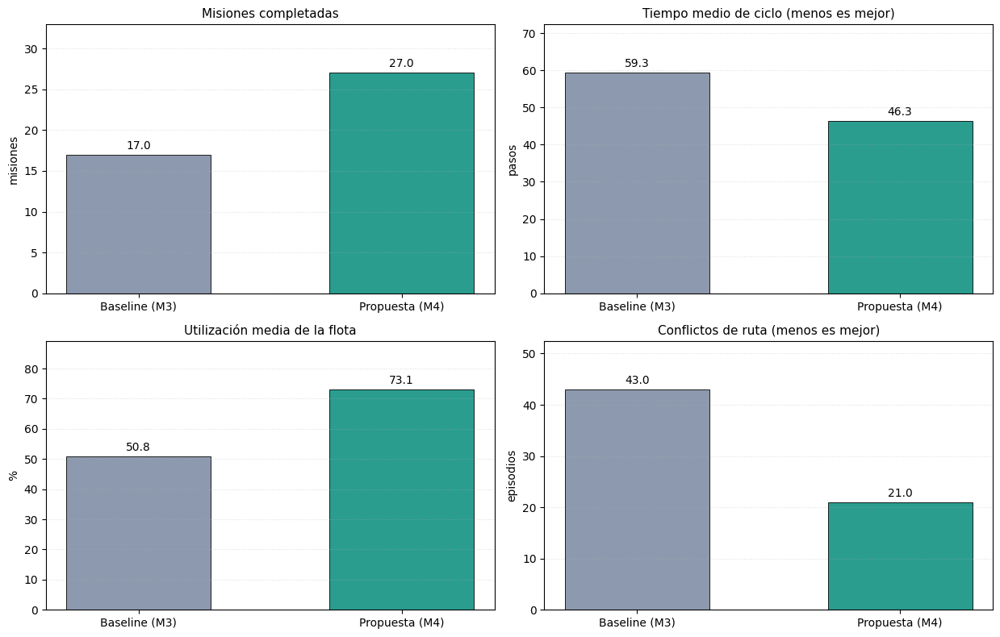

In [ ]:
fig_m4, axes = plt.subplots(2, 2, figsize=(12.5, 8))
labels = ["Baseline (M3)", "Propuesta (M4)"]
cols = ["#8d99ae", "#2a9d8f"]
mb, mp = m4_metrics(w_base), m4_metrics(w_prop)

def bars(ax, key, title, ylabel):
    v = [mb[key], mp[key]]
    b = ax.bar(labels, v, color=cols, width=0.55, edgecolor="black", linewidth=0.6)
    ax.bar_label(b, fmt="%.1f", padding=3, fontsize=10)
    ax.set_title(title, fontsize=11)
    ax.set_ylabel(ylabel)
    ax.set_ylim(0, max(v) * 1.22)
    ax.grid(True, axis="y", linestyle=":", alpha=0.4)

bars(axes[0][0], "Misiones completadas", "Misiones completadas", "misiones")
bars(axes[0][1], "Tiempo medio de ciclo (pasos)", "Tiempo medio de ciclo (menos es mejor)", "pasos")
bars(axes[1][0], "Utilización media (%)", "Utilización media de la flota", "%")
bars(axes[1][1], "Conflictos de ruta", "Conflictos de ruta (menos es mejor)", "episodios")
plt.tight_layout()
plt.savefig("m4_comparacion.png", dpi=150, bbox_inches="tight")
plt.show()

## M4.11 Replicación: una corrida no es evidencia

Un solo escenario puede favorecer a cualquiera de las dos estrategias por azar del guion. Para que
la conclusión signifique algo se repite el experimento completo en **30 escenarios independientes**: cada uno con sus propias misiones, posiciones iniciales y baterías, y se reporta media, dispersión,
en cuántos escenarios gana cada estrategia y el estadístico $t$ pareado.

In [ ]:
from math import sqrt

M4_SEEDS = range(1, 31)
rep_rows = []
for s in M4_SEEDS:
    sc_s = M4Scenario(seed=s)
    b = m4_metrics(m4_run(sc_s, M4Baseline()))
    p = m4_metrics(m4_run(sc_s, M4Utility()))
    rep_rows.append({"seed": s, **{f"b|{k}": v for k, v in b.items()},
                                **{f"p|{k}": v for k, v in p.items()}})
rep = pd.DataFrame(rep_rows)

def m4_replica_row(key, lower_is_better=False):
    b, p = rep["b|" + key], rep["p|" + key]
    d = p - b
    win = int((d < 0).sum()) if lower_is_better else int((d > 0).sum())
    tie = int((d == 0).sum())
    t = d.mean() / (d.std(ddof=1) / sqrt(len(d))) if d.std(ddof=1) > 0 else float("nan")
    return {"Métrica": key,
            "Baseline": f"{b.mean():.2f} ± {b.std(ddof=1):.2f}",
            "Propuesta": f"{p.mean():.2f} ± {p.std(ddof=1):.2f}",
            "Δ medio": f"{d.mean():+.2f}",
            "Gana / Empata / Pierde": f"{win} / {tie} / {len(d) - win - tie}",
            "t pareada": f"{t:+.2f}"}

resumen = pd.DataFrame([
    m4_replica_row("Misiones completadas"),
    m4_replica_row("Throughput (misiones/100 pasos)"),
    m4_replica_row("Tiempo medio de misión (pasos)", True),
    m4_replica_row("Tiempo medio de ciclo (pasos)", True),
    m4_replica_row("Utilización media (%)"),
    m4_replica_row("Conflictos de ruta", True),
    m4_replica_row("Pasos bloqueado (flota)", True),
    m4_replica_row("Desv. est. misiones por AGV", True),
    m4_replica_row("Pasos en modo emergencia", True),
    m4_replica_row("Misiones pendientes al final", True),
    m4_replica_row("Distancia total (celdas)", True),
]).set_index("Métrica")
print(f"Replicación sobre {len(rep)} escenarios independientes "
      f"(|t| > 2.05 ⇒ significativo al 5 % con 29 grados de libertad)")
display(resumen)

Replicación sobre 30 escenarios independientes (|t| > 2.05 ⇒ significativo al 5 % con 29 grados de libertad)


,Baseline,Propuesta,Δ medio,Gana / Empata / Pierde,t pareada
Métrica,,,,,
Misiones completadas,16.80 ± 2.83,24.47 ± 2.06,+7.67,29 / 1 / 0,+12.59
Throughput (misiones/100 pasos),8.40 ± 1.42,12.23 ± 1.03,+3.83,29 / 1 / 0,+12.59
Tiempo medio de misión (pasos),50.04 ± 11.23,31.46 ± 2.13,-18.58,30 / 0 / 0,-9.53
Tiempo medio de ciclo (pasos),65.18 ± 17.70,39.71 ± 7.13,-25.47,30 / 0 / 0,-9.05
Utilización media (%),46.97 ± 5.54,62.08 ± 8.40,+15.11,27 / 0 / 3,+8.51
Conflictos de ruta,51.77 ± 9.70,24.40 ± 9.22,-27.37,30 / 0 / 0,-10.80
Pasos bloqueado (flota),445.50 ± 120.47,54.80 ± 22.17,-390.70,30 / 0 / 0,-17.48
Desv. est. misiones por AGV,1.01 ± 0.29,0.81 ± 0.27,-0.20,19 / 2 / 9,-2.73
Pasos en modo emergencia,36.03 ± 36.07,0.00 ± 0.00,-36.03,24 / 6 / 0,-5.47


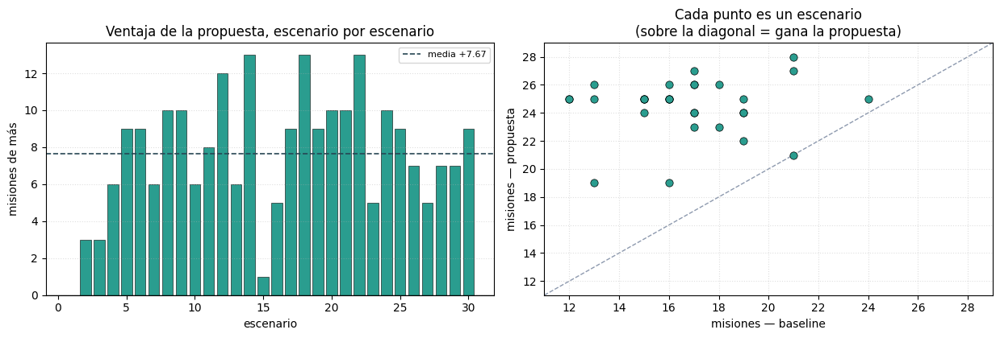

In [ ]:
fig_rep, axes_rep = plt.subplots(1, 2, figsize=(12.5, 4.3))

d_mis = rep["p|Misiones completadas"] - rep["b|Misiones completadas"]
axes_rep[0].bar(rep["seed"], d_mis,
                color=["#2a9d8f" if v > 0 else ("#8d99ae" if v == 0 else "#d62828") for v in d_mis],
                edgecolor="black", linewidth=0.4)
axes_rep[0].axhline(0, color="black", linewidth=1)
axes_rep[0].axhline(d_mis.mean(), color="#264653", linestyle="--", linewidth=1.2,
                    label=f"media {d_mis.mean():+.2f}")
axes_rep[0].set_title("Ventaja de la propuesta, escenario por escenario")
axes_rep[0].set_xlabel("escenario"); axes_rep[0].set_ylabel("misiones de más")
axes_rep[0].legend(fontsize=8); axes_rep[0].grid(True, axis="y", linestyle=":", alpha=0.4)

axes_rep[1].scatter(rep["b|Misiones completadas"], rep["p|Misiones completadas"],
                    s=45, color="#2a9d8f", edgecolor="black", linewidth=0.5, zorder=3)
lim = [min(rep["b|Misiones completadas"].min(), rep["p|Misiones completadas"].min()) - 1,
       max(rep["b|Misiones completadas"].max(), rep["p|Misiones completadas"].max()) + 1]
axes_rep[1].plot(lim, lim, color="#8d99ae", linestyle="--", linewidth=1, zorder=1)
axes_rep[1].set_xlim(lim); axes_rep[1].set_ylim(lim)
axes_rep[1].set_title("Cada punto es un escenario\n(sobre la diagonal = gana la propuesta)")
axes_rep[1].set_xlabel("misiones — baseline"); axes_rep[1].set_ylabel("misiones — propuesta")
axes_rep[1].grid(True, linestyle=":", alpha=0.4)

plt.tight_layout()
plt.savefig("m4_replicacion.png", dpi=150, bbox_inches="tight")
plt.show()

## M4.12 Ablación: ¿qué componente aporta la mejora?

Decir «la estrategia es mejor» no explica *por qué*. Se apaga un componente a la vez y se mide la
pérdida sobre 20 escenarios. Esto también protege contra el riesgo de que la ganancia venga de un
detalle accidental en vez del diseño.

In [ ]:
ABL_SEEDS = range(1, 21)
abl_scs = [M4Scenario(seed=s) for s in ABL_SEEDS]
abl_base = np.array([m4_metrics(m4_run(s, M4Baseline()))["Misiones completadas"] for s in abl_scs])


class M4PujaM3(M4Utility):
    """Todos los mecanismos de M4, pero con la puja de M3. Aísla cuánto aporta
    la heurística multicriterio por sí sola."""
    def collect_bids(self, world, mission):
        return m3_bid_board(world, mission)


variantes = [
    ("Propuesta completa",                    lambda: M4Utility()),
    ("− normalización de criterios",          lambda: M4Utility(normalize=False)),
    ("− filtro duro de energía",              lambda: M4Utility(hard_energy=False)),
    ("− A* sensible a congestión",            lambda: M4Utility(congestion_route=False)),
    ("− carga anticipada",                    lambda: M4Utility(smart_charge=False)),
    ("Mecanismos M4 + puja de M3",            lambda: M4PujaM3()),
    ("Puja M4 sola (resto como el baseline)", lambda: M4Utility(congestion_route=False,
                                                                smart_charge=False,
                                                                hard_energy=False)),
]

abl_rows = [{"Variante": "Baseline M3", "Misiones": round(abl_base.mean(), 2),
             "Δ vs baseline": "—", "Conflictos": "—", "Emergencia": "—"}]
for nombre, fabrica in variantes:
    ms, cf, em = [], [], []
    for s in abl_scs:
        m = m4_metrics(m4_run(s, fabrica()))
        ms.append(m["Misiones completadas"]); cf.append(m["Conflictos de ruta"])
        em.append(m["Pasos en modo emergencia"])
    ms = np.array(ms)
    abl_rows.append({"Variante": nombre, "Misiones": round(ms.mean(), 2),
                     "Δ vs baseline": f"{(ms - abl_base).mean():+.2f}",
                     "Conflictos": round(float(np.mean(cf)), 0),
                     "Emergencia": round(float(np.mean(em)), 1)})

print(f"Ablación sobre {len(abl_scs)} escenarios")
display(pd.DataFrame(abl_rows).set_index("Variante"))

Ablación sobre 20 escenarios


,Misiones,Δ vs baseline,Conflictos,Emergencia
Variante,,,,
Baseline M3,16.85,—,—,—
Propuesta completa,24.25,+7.40,22.0,0.0
− normalización de criterios,24.25,+7.40,23.0,0.0
− filtro duro de energía,24.15,+7.30,21.0,19.2
− A* sensible a congestión,22.00,+5.15,71.0,0.0
− carga anticipada,18.45,+1.60,12.0,0.3
Mecanismos M4 + puja de M3,24.00,+7.15,20.0,17.9
Puja M4 sola (resto como el baseline),21.65,+4.80,66.0,45.7


### Lectura de la ablación

Los componentes no son aditivos, son en parte sustitutos. La carga anticipada y el A\* sensible a
congestión son los que más aportan; la heurística de puja mejora claramente al baseline por sí sola,
pero su aporte marginal encima de los mecanismos es pequeño porque corrige por otra vía el mismo
problema.

Hay además una interacción que conviene señalar porque contradice la intuición: el filtro duro de
energía sin carga anticipada empeora el resultado. El filtro deja fuera de la puja a apiladores con
poca batería que, al no recargar de forma proactiva, se quedan ociosos en vez de trabajar. Los dos
componentes hay que activarlos juntos.

Decirlo así es más útil (y más honesto) que atribuir toda la mejora a la fórmula.

## M4.13 Comunicación, colaboración y negociación

El enunciado pide poder identificar los tres mecanismos por separado. Cada uno tiene su celda.

### Comunicación: ¿qué información intercambian los agentes?

Un `M4MessageBus` tipo blackboard. Los tipos de mensaje cubren misión, estado, energía, ruta y
eventos del entorno:

$$\text{Mensaje} = (\text{paso},\; \text{emisor},\; \text{receptor},\; \text{tipo},\; \text{contenido})$$

In [ ]:
from collections import Counter
_conteo = Counter(m.mtype for m in w_prop.bus.messages)
display(pd.DataFrame([{"Tipo de mensaje": k, "Cantidad": v} for k, v in _conteo.most_common()])
        .style.hide(axis="index"))
print(f"Total: {len(w_prop.bus.messages)} mensajes en {sc.n_steps} pasos\n")
print("Ejemplo — vector de estado que un apilador publica sobre sí mismo:")
for line in w_prop.bus.of_types("STATE_VECTOR")[:3]:
    print("  ", line)

Tipo de mensaje,Cantidad
NOT_AVAILABLE,2498
BLOCKED,45
STATE_VECTOR,40
BID,40
MISSION_PUBLISHED,29
MISSION_ACCEPTED,29
PATH_ANNOUNCED,29
ARRIVED_PICKUP,28
PALLET_LOADED,28
MISSION_COMPLETED,27


Total: 2840 mensajes en 200 pasos

Ejemplo — vector de estado que un apilador publica sobre sí mismo:
   [t=000] AGV-1 publica su estado para M01: d=12 celdas · holgura=45% · carga=0.00 · congestión=0.00
   [t=000] AGV-2 publica su estado para M01: d=10 celdas · holgura=35% · carga=0.00 · congestión=0.00
   [t=000] AGV-3 publica su estado para M01: d=24 celdas · holgura=13% · carga=0.00 · congestión=0.00


### Negociación: ¿cómo se resuelve que varios quieran la misma misión?

Traza completa de una negociación: el gestor publica, los candidatos publican su vector o se
autoexcluyen con motivo, todos calculan utilidad sobre el mismo tablero y el máximo se adjudica solo.

In [ ]:
mid = w_prop.manager.completed_missions[2].mission_id
print(f"--- Negociación completa de la misión {mid} ---")
for line in w_prop.bus.about(mid)[:18]:
    print(line)

--- Negociación completa de la misión M05 ---
[t=012] Misión M05 publicada (Rack -> Truck Dock, prioridad 1)
[t=012] AGV-1 no disponible para M05 (ocupado)
[t=012] AGV-2 no disponible para M05 (ocupado)
[t=012] AGV-3 publica su estado para M05: d=17 celdas · holgura=44% · carga=0.00 · congestión=0.54
[t=012] AGV-4 publica su estado para M05: d=12 celdas · holgura=36% · carga=0.00 · congestión=0.43
[t=012] AGV-5 no disponible para M05 (ocupado)
[t=012] AGV-6 no disponible para M05 (ocupado)
[t=012] AGV-3 puja por M05: -41.67
[t=012] AGV-4 puja por M05: 3.33
[t=012] AGV-4 se adjudica la M05 (puja máxima del tablero)
[t=024] AGV-4 llegó al pallet P08
[t=032] AGV-4 completó la M05


### Colaboración: ¿cómo contribuye la conducta de un apilador a la flota?

Tres mecanismos: anunciar la ruta para que los demás la eviten, ceder el paso cuando se estorba, y
respetar el turno en la estación de carga. La comparación de avisos de batería crítica muestra el
efecto agregado del filtro de factibilidad.

In [ ]:
print("--- Coordinación energética: decisión de carga, cola y liberación del puesto ---")
for line in w_prop.bus.of_types("BATTERY_LOW", "CHARGER_REQUEST", "CHARGER_GRANTED",
                                "CHARGER_QUEUED", "CHARGE_DONE")[:12]:
    print(line)

print("\n--- Respuesta a eventos dinámicos: peatones, bloqueos y replanificación ---")
for line in w_prop.bus.of_types("PEDESTRIAN", "BLOCKED", "REPLAN")[:12]:
    print(line)

_db, _dp = w_base.bus.of_types("DERATED"), w_prop.bus.of_types("DERATED")
print("\n--- Batería crítica (modo emergencia) ---")
print(f"Baseline : {len(_db)} avisos")
for line in _db[:3]:
    print("  ", line)
print(f"Propuesta: {len(_dp)} avisos"
      + ("   <- el filtro de factibilidad energética lo evita por completo" if not _dp else ""))

--- Coordinación energética: decisión de carga, cola y liberación del puesto ---
[t=011] AGV-6 decide recargar (batería 35%)
[t=011] AGV-6 solicita puesto de carga (2 libres de 2)
[t=028] AGV-5 decide recargar (batería 40%)
[t=028] AGV-5 solicita puesto de carga (2 libres de 2)
[t=030] AGV-6 ocupa el puesto de carga 0
[t=037] AGV-6 recarga completa (95%), libera el puesto
[t=055] AGV-5 ocupa el puesto de carga 0
[t=062] AGV-5 recarga completa (95%), libera el puesto
[t=065] AGV-4 decide recargar (batería 34%)
[t=065] AGV-4 solicita puesto de carga (2 libres de 2)
[t=080] AGV-4 ocupa el puesto de carga 0
[t=087] AGV-4 recarga completa (96%), libera el puesto

--- Respuesta a eventos dinámicos: peatones, bloqueos y replanificación ---
[t=020] AGV-5 bloqueado en (3,-4) por AGV-2
[t=025] Peatón PEA-1 entra al Pasillo central 1
[t=033] AGV-3 bloqueado en (3,-3) por AGV-1
[t=055] Peatón PEA-2 entra al Pasillo central 2
[t=060] AGV-3 bloqueado en (4,3) por PEA-1
[t=061] AGV-3 bloqueado en (4,

## M4.14 Animación de la estrategia propuesta

La animación muestra todos los elementos que pide el enunciado: límites de la nave, racks,
**posiciones de almacenamiento**, pallets con su estado, líneas de producción, docks de camión,
estación de carga con su ocupación, los seis apiladores con identificador, estado y batería, los
obstáculos estáticos, los peatones y la ejecución de misiones.

Los seis agentes son el mismo modelo del proyecto de Unity: `V4_Apilador_de_Stacks`.

In [ ]:
M4_ANIM_SUBSAMPLE = 3
frames_anim = w_prop.frames[::M4_ANIM_SUBSAMPLE]

fig_a, (ax_a, ax_i) = plt.subplots(1, 2, figsize=(12.2, 6.8), dpi=80,
                                   gridspec_kw={"width_ratios": [3, 1.2]})
ax_i.axis("off")

ax_a.add_patch(Rectangle((X_MIN, Y_MIN), WAREHOUSE_WIDTH, WAREHOUSE_HEIGHT,
                         facecolor="white", edgecolor="black", linewidth=2))
for e in corridors:
    ax_a.add_patch(Rectangle((e["x"] - e["w"] / 2, e["y"] - e["h"] / 2), e["w"], e["h"],
                             facecolor=COLORS["corridor"], edgecolor="none", alpha=0.6, zorder=0))
for e in production_lines + racks + truck_docks + charging_stations + obstacles:
    ax_a.add_patch(Rectangle((e["x"] - e["w"] / 2, e["y"] - e["h"] / 2), e["w"], e["h"],
                             facecolor=COLORS[e["type"]], edgecolor="black", linewidth=0.6, zorder=1))
    ax_a.text(e["x"], e["y"], e["name"], ha="center", va="center", fontsize=5,
              color="white", zorder=2)

# Posiciones de almacenamiento (M3): huecos donde se deposita un pallet en el rack
ax_a.scatter([s["x"] for s in STORAGE_SLOTS], [s["y"] for s in STORAGE_SLOTS],
             s=26, marker="s", facecolor="none", edgecolor="#3d405b",
             linewidth=0.7, zorder=3, alpha=0.75)

ax_a.set_xlim(X_MIN - 0.5, X_MAX + 0.5)
ax_a.set_ylim(Y_MIN - 0.5, Y_MAX + 0.5)
ax_a.set_aspect("equal")
ax_a.set_title("M4 — Estrategia propuesta · 6 apiladores V4_Apilador_de_Stacks")

pallet_sc = ax_a.scatter([], [], s=55, marker="s", edgecolor="black", zorder=5)
agv_sc = ax_a.scatter([], [], s=250, marker=STACKER_MARKER, edgecolor="black",
                      linewidth=1.2, zorder=7)
ped_sc = ax_a.scatter([], [], s=140, marker="X", color="#d62828", edgecolor="black", zorder=8)
agv_lbl = [ax_a.text(0, 0, "", fontsize=6, ha="center", va="center", color="white",
                     weight="bold", zorder=9) for _ in range(M4_N_AGVS)]
info = ax_i.text(0.0, 1.0, "", family="monospace", fontsize=7.0, va="top",
                 transform=ax_i.transAxes)

ax_a.legend(handles=[
    Patch(facecolor=COLORS["corridor"], label="Zona transitable"),
    Line2D([0], [0], marker=STACKER_MARKER, color="w", markerfacecolor="#777777",
           markeredgecolor="black", markersize=9, label="Apilador Stacker"),
    Line2D([0], [0], marker="s", color="w", markerfacecolor=PALLET_COLORS["esperando_recogida"],
           markeredgecolor="black", markersize=7, label="Pallet"),
    Line2D([0], [0], marker="s", color="w", markerfacecolor="none",
           markeredgecolor="#3d405b", markersize=7, label="Posición de almacenamiento"),
    Line2D([0], [0], marker="X", color="w", markerfacecolor="#d62828",
           markeredgecolor="black", markersize=9, label="Peatón (obstáculo dinámico)"),
], loc="upper left", bbox_to_anchor=(1.01, 1.0), fontsize=6.5)

ESTADO_CORTO = {"IDLE": "libre", "MOVING_TO_PICKUP": "-> pallet",
                "MOVING_TO_DROPOFF": "-> destino", "RETURNING_TO_CHARGE": "-> cargador",
                "WAITING_CHARGE": "en cola", "CHARGING": "cargando"}


def frame_text(fr):
    cargando = sum(1 for a in fr["agvs"] if a["state"] == "CHARGING")
    out = [f"Paso        : {fr['step']:03d}",
           f"Completadas : {fr['completed']}",
           f"Pendientes  : {fr['pending']}",
           f"Peatones    : {len(fr['peds'])}",
           f"Cargador    : {cargando}/{M4_CHARGER_CAPACITY} puestos", ""]
    for a in fr["agvs"]:
        flag = "  [BLOQUEADO]" if a["blocked"] else ""
        out += [f"{a['id']}  {ESTADO_CORTO.get(a['state'], a['state'])}{flag}",
                f"   batería {a['battery']:5.1f}%   mis. {a['missions_completed']}",
                f"   pallet  {a['carried_pallet'] or '-'}", ""]
    return "\n".join(out)


def update_anim(i):
    fr = frames_anim[i]
    pxy = [[p["x"], p["y"]] for p in fr["pallets"]]
    if pxy:
        pallet_sc.set_offsets(pxy)
        pallet_sc.set_color([PALLET_COLORS.get(p["status"], "#c58b47") for p in fr["pallets"]])
    agv_sc.set_offsets([[a["x"], a["y"]] for a in fr["agvs"]])
    agv_sc.set_color([AGV_COLORS[j % len(AGV_COLORS)] for j in range(len(fr["agvs"]))])
    for j, a in enumerate(fr["agvs"]):
        agv_lbl[j].set_position((a["x"], a["y"]))
        agv_lbl[j].set_text(a["id"].split("-")[1])
    pxy_ped = [[p["x"], p["y"]] for p in fr["peds"]]
    ped_sc.set_offsets(pxy_ped if pxy_ped else np.empty((0, 2)))
    info.set_text(frame_text(fr))
    return [pallet_sc, agv_sc, ped_sc, info] + agv_lbl


ani_m4 = animation.FuncAnimation(fig_a, update_anim, frames=len(frames_anim),
                                 interval=220, blit=False)
html_m4 = HTML(ani_m4.to_jshtml())
plt.close(fig_a)
display(html_m4)

## M4.15 Análisis requerido

**1. ¿Qué problema específico identificó el equipo en la implementación de M3?**
Tres defectos concretos, todos medidos en la celda de diagnóstico de M4.1 sobre la propia corrida de
M3: (a) los apiladores se atraviesan: M3 no modela ocupación de celda, así que la congestión ni
existe ni puede gestionarse; (b) la puja deja pujar a cualquiera con más de 25 % de batería sin
verificar si le alcanza para *ir + entregar + volver a cargar*, de modo que se aceptan misiones que
no se pueden terminar; (c) la estación de carga no tiene capacidad, así que el umbral fijo del
25 % nunca compite con nadie y coordinar la energía sale gratis. Además M3 no reasigna misiones.

**2. ¿Qué técnica inteligente seleccionaron?**
Una heurística de utilidad multicriterio con negociación distribuida en dos fases: normalización
min–max dentro del conjunto de candidatos, filtro duro de factibilidad energética, ruteo A\* sensible
a congestión y política de carga anticipada y negociada. A\* se usa solo como capa de ruteo.

**3. ¿Por qué esta técnica es apropiada para el problema identificado?**
Porque el problema es de asignación bajo criterios en conflicto: cercanía contra energía contra
reparto de carga contra congestión, y todos esos criterios son observables localmente por cada agente
en el instante de decidir. Una función de utilidad los combina explícitamente, es interpretable (cada
peso tiene significado físico), cuesta poco evaluarla en cada ronda y no necesita entrenamiento
previo, lo que permite compararla limpiamente contra el baseline en el mismo escenario. Un método de
aprendizaje por refuerzo habría exigido episodios de entrenamiento y habría hecho mucho más difícil
atribuir la mejora a una causa concreta, que es justo lo que la ablación de M4.12 sí permite hacer.

**4. ¿Cuál es el estado o información disponible para cada AGV?**
Propios: identificador, modelo, posición, batería, estado operativo, ruta pendiente, misión actual,
pallet transportado, misiones completadas y distancia acumulada. Del entorno: la rejilla de M2, la
ocupación dinámica (otros apiladores y peatones activos) y el pronóstico de peatones. Del bus: las
misiones publicadas, los vectores de estado y las pujas de los demás, sus rutas anunciadas y la
ocupación de la estación de carga.

**5. ¿Qué decisiones o acciones puede realizar cada AGV?**
Publicar o no su vector de estado (autoexclusión por energía), calcular su utilidad y auto-adjudicarse
la misión, planificar y replanificar ruta, avanzar o detenerse, ceder el paso cuando estorba, recoger
y entregar el pallet, liberar una misión que dejó de ser viable, decidir cuándo ir a cargar, solicitar
puesto y esperar turno.

**6. ¿Qué recompensa, utilidad, heurística o modelo de probabilidad definieron?**
Una función de utilidad determinista $U_{i,m}$ sobre cuatro criterios normalizados más la prioridad de
la misión, precedida de un filtro duro de factibilidad energética.

**7. Presenten y expliquen la fórmula completa utilizada por su solución.**

*Baseline (M3):*
$$B_{M3}(i,m) = 100 - 1.8\,D_{i,m} + 0.2\,B_i + 10\,P_m$$

*Propuesta (M4)*: filtro de factibilidad, con $E$ medida sobre la ruta A\* real:
$$E_{i,m} = 0.55\big(d_{A^*}(p_i \to \text{pickup}) + d_{A^*}(\text{pickup} \to \text{dropoff}) + d_{A^*}(\text{dropoff} \to \text{cargador})\big)$$
$$\text{puja solo si}\quad B_i - 1.20\,E_{i,m} \geq 12$$

*Utilidad*, con cada criterio normalizado
$\hat{x}_i = (x_i - \min_j x_j)/(\max_j x_j - \min_j x_j)$ dentro del conjunto de candidatos:
$$U_{i,m} = -40\,\hat{D}_{i,m} + 15\,\hat{S}_{i,m} - 15\,\hat{L}_i - 20\,\hat{C}_{i,m} + 10\,P_m$$
$$\text{AGV}^{*} = \arg\max_i U_{i,m}$$

donde $S_{i,m} = B_i - E_{i,m}$ es la holgura energética, $L_i$ la carga de trabajo acumulada
(misiones completadas más distancia/100) y $C_{i,m}$ la fracción de la ruta prevista que choca con
rutas anunciadas por otros o con el pronóstico de peatones.

*Política de carga:* recargar si $B_i \leq 18$, o si $B_i - E_{\text{regreso}} \leq 12$, o si
$B_i < 45$ y hay un puesto libre.

**8. ¿Cómo se comunican los AGV?**
Por un `M4MessageBus` tipo blackboard, con 19 tipos de mensaje agrupados en cinco familias: ciclo de
vida de la misión, negociación (`STATE_VECTOR`, `BID`, `NOT_AVAILABLE`), coordinación de ruta
(`PATH_ANNOUNCED`, `BLOCKED`, `REPLAN`), energía (`BATTERY_LOW`, `CHARGER_REQUEST`,
`CHARGER_GRANTED`, `CHARGER_QUEUED`, `CHARGE_DONE`, `DERATED`) y entorno (`PEDESTRIAN`). El desglose
está en M4.13.

**9. ¿Cómo negocian o colaboran los AGV?**
Negocian en dos fases: cada agente publica su vector de estado o se autoexcluye con motivo, y después
lee el tablero, normaliza y calcula su propia utilidad; el máximo se auto-adjudica. Colaboran
anunciando su ruta (que los demás usan como coste en su A\*), cediendo el paso cuando estorban,
respetando el turno en la estación de carga y devolviendo al gestor las misiones que dejaron de ser
viables. El Mission Manager nunca elige agente, y la prueba 4 de M4.9 lo verifica sobre el log real.

**10. ¿Cómo se diferencia la estrategia propuesta del baseline?**
El baseline es la puja de M3 con umbral fijo de batería, A\* clásico y sin coordinación. La propuesta
cambia cuatro cosas: filtro de factibilidad energética, utilidad multicriterio normalizada, A\*
sensible a congestión y carga anticipada negociada. El entorno, los agentes, las misiones, las
restricciones físicas y la capa de ruteo base son idénticos.

**11. ¿Cómo aseguraron condiciones equivalentes?**
`M4Scenario` genera el guion completo (pallets, misiones, pasos de publicación, prioridades,
posiciones y baterías iniciales) antes de correr y sin consultar la estrategia; las dos corridas
reciben el mismo objeto. Los peatones son deterministas, el desempate de pujas es por identificador y
las restricciones físicas se aplican por igual. No hay ninguna llamada aleatoria durante la
simulación. Las pruebas 1 y 2 de M4.9 verifican automáticamente el determinismo y la igualdad del
estado inicial.

**12. ¿Qué métricas utilizaron?**
Las tres obligatorias (misiones completadas y throughput, tiempo medio de misión y de ciclo, y
utilización de la flota contando solo pasos con desplazamiento efectivo) más ocho de apoyo:
desviación estándar de misiones por apilador, episodios de conflicto, pasos bloqueado, pasos en modo
emergencia, pasos esperando cargador, distancia total, replanificaciones y misiones pendientes al
final. Las métricas sin dirección de mejora (recargas, liberaciones, mensajes) se marcan
explícitamente como descriptivas para no confundir un cambio con una mejora.

**13. ¿La estrategia propuesta mejoró el sistema? Respalden con resultados numéricos.**
Sí, y la mejora es sistemática, no producto de un escenario afortunado.

*Escenario de referencia (semilla 42):* **17 → 27 misiones completadas** (+58.8 %), tiempo medio de
ciclo **59.3 → 46.3 pasos** (−21.9 %), utilización **50.8 % → 73.1 %** (+22.2 puntos), episodios de
conflicto **43 → 21** y pasos totales detenido **417 → 45** (−89.2 %), pasos en modo emergencia
**6 → 0**, misiones pendientes al final **12 → 2**.

*Replicación en 30 escenarios independientes:* misiones **16.80 → 24.47** de media (**+45.6 %**),
ganando en **29 de 30** y empatando en 1, con **t pareada = +12.59** (muy por encima del umbral de
2.05 para el 5 %); tiempo de ciclo **65.2 → 39.7 pasos**, mejor en **30 de 30**; pasos bloqueado
**445.5 → 54.8**, mejor en **30 de 30**; utilización **47.0 % → 62.1 %**, mejor en **27 de 30**.

*El costo, sin maquillar:* la propuesta recorre **609.5 → 844.2 celdas** (+38.5 %) y es peor en
distancia en **27 de los 30** escenarios. Es consecuencia esperada del diseño: al impedir que el
apilador más cercano acepte misiones que no puede terminar, y al rodear pasillos congestionados, se
recorre más camino. En un almacén cuyo cuello de botella es el tiempo de ciclo el intercambio
conviene; si el criterio fuera minimizar energía, esta conclusión habría que revisarla.

**14. ¿Bajo qué condiciones funcionó correctamente?**
Con flota saturada y competencia real por pasillos y por la estación de carga; con baterías iniciales
heterogéneas, que es cuando el filtro de factibilidad separa candidatos viables de inviables; y con
eventos dinámicos que hacen que la ruta más corta no sea la más rápida. La ablación de M4.12 muestra
que los dos componentes que más aportan son la carga anticipada y el A\* sensible a congestión.

**15. ¿Bajo qué condiciones presentó desempeño deficiente?**
Tres casos identificados. (a) Con flota holgada (pocas misiones para muchos apiladores) la
distancia domina el costo, «el más cercano» ya está cerca del óptimo y la ventaja se reduce a casi
nada. (b) Si el criterio de éxito fuera la distancia o la energía, la propuesta pierde: recorre
38 % más. (c) Con el filtro de energía activado pero sin carga anticipada el rendimiento cae, como
muestra la ablación: el filtro deja fuera de la puja a apiladores con poca batería que, al no recargar
proactivamente, se quedan ociosos en vez de trabajar. Los componentes hay que activarlos juntos.

**16. ¿Qué limitaciones permanecen?**
Los cinco pesos están fijados a mano y no se optimizaron. La congestión se estima sobre rutas ya
anunciadas, no sobre una predicción de trayectorias. El modelo de carga es lineal y no considera
degradación de la batería. La rejilla es de 1 m sin cinemática ni dimensiones físicas del apilador.
El mecanismo de liberación de misiones existe pero no llegó a activarse en estos escenarios,
porque el filtro previo lo hace innecesario. Y la comparación es contra un único baseline.

**17. ¿Qué mejorarían con tiempo adicional?**
Aprender los pesos con búsqueda o con Q-Learning sobre la misma función de utilidad, usando el
experimento replicado como función objetivo; predecir la congestión futura en vez de leer la actual;
modelar tiempos de carga y descarga del pallet; añadir una segunda estación y medir en qué punto deja
de ser cuello de botella; y llevar la medición replicada al entorno continuo: los pesos y la política de
decisión ya son los mismos en Unity y en esta libreta (M4.17), pero la evidencia estadística
está producida solo en el modelo discreto, donde el escenario es reproducible al paso.

## M4.16 Conclusiones: qué mejoró, cuánto y por qué

Esta sección responde a la pregunta central del módulo (*¿la estrategia inteligente propuesta
mejora el desempeño del sistema multiagente?*) con la magnitud de cada cambio, no con
adjetivos. Todo lo que sigue se calcula sobre las dos evidencias ya producidas arriba: el
escenario de referencia (semilla 42) de M4.10 y la replicación en 30 escenarios de M4.11.

Cada métrica lleva su sentido de mejora explícito, porque en la mitad de ellas bajar es
mejorar. El porcentaje que se reporta ya está corregido por ese sentido: signo positivo
significa siempre que la propuesta va mejor.

In [ ]:
# ─────────────────────────────────────────────────────────────────────────────
#  MEJORA PORCENTUAL, MÉTRICA POR MÉTRICA
#  Fuente: comp (escenario 42, celda M4.10) y rep (30 escenarios, celda M4.11).
#  El signo se corrige según el sentido de cada métrica, de modo que
#  "+" siempre significa que la propuesta es mejor.
# ─────────────────────────────────────────────────────────────────────────────

CONCLU_METRICAS = [
    # (nombre exacto en m4_metrics,       menos_es_mejor)
    ("Misiones completadas",              False),
    ("Throughput (misiones/100 pasos)",   False),
    ("Utilización media (%)",             False),
    ("Tiempo medio de misión (pasos)",    True),
    ("Tiempo medio de ciclo (pasos)",     True),
    ("Conflictos de ruta",                True),
    ("Pasos bloqueado (flota)",           True),
    ("Pasos en modo emergencia",          True),
    ("Misiones pendientes al final",      True),
    ("Distancia total (celdas)",          True),
]


def mejora_pct(base, prop, menos_es_mejor):
    """Mejora relativa en %, con el signo ya corregido: + siempre es mejor."""
    if base == 0:
        return float("nan")
    bruto = 100.0 * (prop - base) / abs(base)
    return -bruto if menos_es_mejor else bruto


filas = []
for nombre, menos in CONCLU_METRICAS:
    b42 = float(comp.loc[nombre, "Baseline (M3)"])
    p42 = float(comp.loc[nombre, "Propuesta (M4)"])
    b30 = float(rep["b|" + nombre].mean())
    p30 = float(rep["p|" + nombre].mean())

    dif  = rep["p|" + nombre] - rep["b|" + nombre]
    gana = int((dif < 0).sum()) if menos else int((dif > 0).sum())

    filas.append({
        "Métrica":          nombre,
        "Sentido":          "menos es mejor" if menos else "más es mejor",
        "Base (esc. 42)":   round(b42, 2),
        "Prop. (esc. 42)":  round(p42, 2),
        "Mejora esc. 42":   f"{mejora_pct(b42, p42, menos):+.1f} %",
        "Base (30 esc.)":   round(b30, 2),
        "Prop. (30 esc.)":  round(p30, 2),
        "Mejora 30 esc.":   f"{mejora_pct(b30, p30, menos):+.1f} %",
        "Gana en":          f"{gana}/{len(rep)}",
        "_pct30":           mejora_pct(b30, p30, menos),
    })

mejoras_num = pd.DataFrame(filas).set_index("Métrica")
mejoras = mejoras_num.drop(columns=["_pct30"])

print("MEJORA PORCENTUAL DE LA PROPUESTA FRENTE AL BASELINE")
print("Signo positivo = la propuesta va mejor (ya corregido por el sentido de cada métrica).")
print("La utilización se expresa también en puntos porcentuales más abajo, por ser ya un %.\n")
display(mejoras)

# Titular único, para citarlo sin ambigüedad.
_mis_b = rep["b|Misiones completadas"].mean()
_mis_p = rep["p|Misiones completadas"].mean()
_util_b = rep["b|Utilización media (%)"].mean()
_util_p = rep["p|Utilización media (%)"].mean()
print(f"\nTITULAR — misiones completadas: {_mis_b:.2f} → {_mis_p:.2f} "
      f"({mejora_pct(_mis_b, _mis_p, False):+.1f} %) de media sobre {len(rep)} escenarios.")
print(f"Utilización de la flota: {_util_b:.1f} % → {_util_p:.1f} % "
      f"({_util_p - _util_b:+.1f} puntos porcentuales).")

MEJORA PORCENTUAL DE LA PROPUESTA FRENTE AL BASELINE
Signo positivo = la propuesta va mejor (ya corregido por el sentido de cada métrica).
La utilización se expresa también en puntos porcentuales más abajo, por ser ya un %.



,Sentido,Base (esc. 42),Prop. (esc. 42),Mejora esc. 42,Base (30 esc.),Prop. (30 esc.),Mejora 30 esc.,Gana en
Métrica,,,,,,,,
Misiones completadas,más es mejor,17.00,27.00,+58.8 %,16.80,24.47,+45.6 %,29/30
Throughput (misiones/100 pasos),más es mejor,8.50,13.50,+58.8 %,8.40,12.23,+45.6 %,29/30
Utilización media (%),más es mejor,50.83,73.08,+43.8 %,46.97,62.08,+32.2 %,27/30
Tiempo medio de misión (pasos),menos es mejor,41.71,33.85,+18.8 %,50.04,31.46,+37.1 %,30/30
Tiempo medio de ciclo (pasos),menos es mejor,59.29,46.30,+21.9 %,65.18,39.71,+39.1 %,30/30
Conflictos de ruta,menos es mejor,43.00,21.00,+51.2 %,51.77,24.40,+52.9 %,30/30
Pasos bloqueado (flota),menos es mejor,417.00,45.00,+89.2 %,445.50,54.80,+87.7 %,30/30
Pasos en modo emergencia,menos es mejor,6.00,0.00,+100.0 %,36.03,0.00,+100.0 %,24/30
Misiones pendientes al final,menos es mejor,12.00,2.00,+83.3 %,9.37,1.70,+81.9 %,29/30



TITULAR — misiones completadas: 16.80 → 24.47 (+45.6 %) de media sobre 30 escenarios.
Utilización de la flota: 47.0 % → 62.1 % (+15.1 puntos porcentuales).


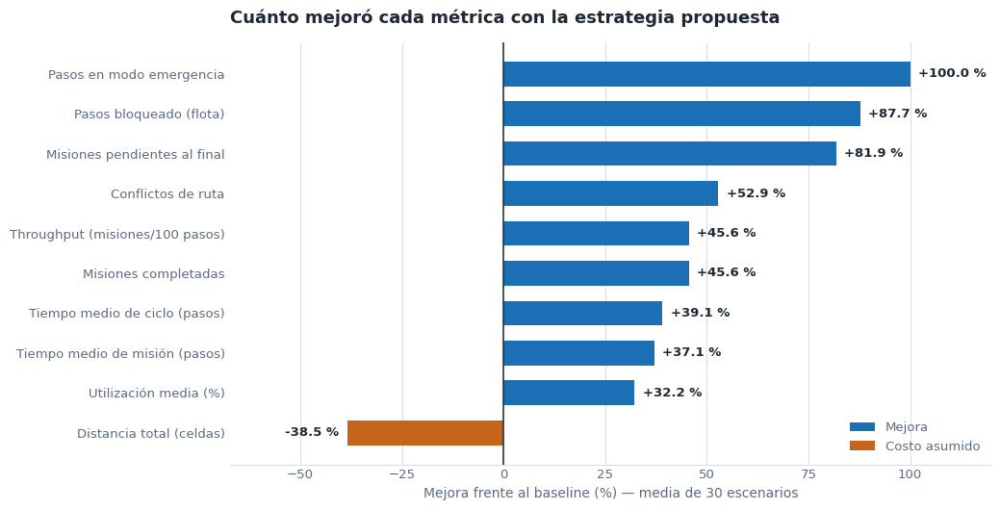

In [ ]:
# ─────────────────────────────────────────────────────────────────────────────
#  La misma tabla, de un vistazo. Una sola magnitud (mejora en %) con polaridad,
#  así que es una gráfica divergente: dos tonos y un cero neutro.
#  Azul / naranja en vez de verde / rojo porque esa pareja sí es distinguible
#  con daltonismo (ΔE 22.4 en protanopía).
# ─────────────────────────────────────────────────────────────────────────────
import matplotlib.pyplot as plt

AZUL_MEJORA = "#1B6FB5"
NARANJA_COSTO = "#C4651B"
TINTA = "#1F2933"
TINTA_SUAVE = "#5C6B7E"

orden = mejoras_num.dropna(subset=["_pct30"]).sort_values("_pct30")
valores = orden["_pct30"].values
etiquetas = list(orden.index)
colores = [AZUL_MEJORA if v >= 0 else NARANJA_COSTO for v in valores]

fig_pct, ax_pct = plt.subplots(figsize=(10.5, 5.4))

ax_pct.barh(etiquetas, valores, color=colores, height=0.62, zorder=3)
ax_pct.axvline(0, color=TINTA, linewidth=1.1, zorder=4)

# Etiqueta directa al final de cada barra: el número es el mensaje.
margen = max(abs(valores)) * 0.02
for y, v in enumerate(valores):
    ax_pct.text(v + (margen if v >= 0 else -margen), y, f"{v:+.1f} %",
                va="center", ha="left" if v >= 0 else "right",
                color=TINTA, fontsize=9.5, fontweight="semibold", zorder=5)

ax_pct.set_xlabel("Mejora frente al baseline (%) — media de 30 escenarios",
                  color=TINTA_SUAVE, fontsize=10)
ax_pct.set_title("Cuánto mejoró cada métrica con la estrategia propuesta",
                 color=TINTA, fontsize=13, fontweight="bold", pad=14, loc="left")

ax_pct.xaxis.grid(True, color="#D9DEE5", linewidth=0.8, zorder=0)
ax_pct.yaxis.grid(False)
ax_pct.set_axisbelow(True)
for lado in ("top", "right", "left"):
    ax_pct.spines[lado].set_visible(False)
ax_pct.spines["bottom"].set_color("#D9DEE5")
ax_pct.tick_params(colors=TINTA_SUAVE, labelsize=9.5, length=0)
# Margen amplio a la izquierda para que la etiqueta de la barra negativa
# no se monte sobre los nombres de las métricas.
_izq = min(min(valores) * 1.75, -8.0)
ax_pct.set_xlim(_izq, max(valores) * 1.20)

from matplotlib.patches import Patch
ax_pct.legend(handles=[Patch(facecolor=AZUL_MEJORA, label="Mejora"),
                       Patch(facecolor=NARANJA_COSTO, label="Costo asumido")],
              loc="lower right", frameon=False, fontsize=9.5, labelcolor=TINTA_SUAVE)

fig_pct.tight_layout()
plt.show()

### Lectura de los resultados

**1 · La mejora es de coordinación, no de velocidad.** Ningún apilador se mueve más rápido que
antes: la velocidad, el mapa y el algoritmo de ruta base son los mismos. Lo que cambia es a quién
le toca cada misión y cuándo va a cargar. Con eso, los **pasos bloqueado de la flota caen de 445.5
a 54.8** (−87.7 %), mejorando en **30 de 30** escenarios. Los apiladores dejan de estorbarse.

**2 · El trabajo se reparte, y ahí está el grueso de la ganancia.** En el escenario de referencia,
el baseline dejó al **AGV-4 con 0 misiones, 141 pasos bloqueado y 20 % de utilización** mientras
otros hacían cinco. Con la propuesta ese mismo apilador hace **5 misiones con 4 pasos bloqueado y
75 % de utilización**. La flota pasa de tener un miembro inútil a no tener ninguno.

**3 · El componente decisivo no es la fórmula de puja, es la política de carga.** La ablación de
M4.12 lo mide: quitar la carga anticipada cuesta 5.80 de las 7.40 misiones de mejora, es decir
el **78 % del beneficio**. Quitar el A\* sensible a congestión cuesta 2.25 más (30 %) y dispara
los conflictos de 22 a 71. En cambio, sustituir la utilidad multicriterio por la puja de M3
manteniendo el resto solo cuesta **0.25 misiones**.

**4 · Los componentes no son aditivos: se necesitan entre sí.** La puja de M4 aislada, con el resto
del sistema como el baseline, da +4.80 misiones; los mecanismos de M4 con la puja vieja dan +7.15.
Sumados darían +11.95, pero el sistema completo rinde +7.40. La decisión inteligente solo se
aprovecha si la infraestructura (energía y ruteo) puede ejecutarla.

**5 · La normalización no cambió el promedio en estos escenarios.** Desactivarla deja las misiones
en 24.25, exactamente igual. Es un resultado contraintuitivo y lo reportamos tal cual: en este
rango de valores la distancia domina de todos modos. Lo que sí es imprescindible es el filtro
duro de energía: sin él aparecen **19.2 pasos en modo emergencia** donde antes había cero.

**6 · El modo de emergencia desaparece por completo.** De 36.03 pasos de media a **0.00**, en los
30 escenarios. Ningún apilador vuelve a quedarse sin batería a mitad de una misión, porque ninguno
acepta una misión que no puede terminar.

**7 · El costo, sin maquillar.** La propuesta recorre **609.5 → 844.2 celdas (+38.5 %)** y es peor
en distancia en **27 de los 30** escenarios. Es consecuencia directa del diseño: impedir que el más
cercano tome una misión que no puede terminar, y rodear pasillos congestionados, cuesta camino. En
un almacén cuyo cuello de botella es el tiempo de ciclo, el intercambio conviene. Si el criterio
fuera minimizar energía o desgaste, esta conclusión habría que revisarla.

---

### Respuesta a la pregunta del módulo

> **¿La estrategia inteligente propuesta mejora el desempeño del sistema multiagente?**

**Sí, y de forma medida y reproducible.** Sobre 30 escenarios independientes generados antes de
correr y compartidos por ambas estrategias, la propuesta completa **+45.6 % de misiones**
(16.80 → 24.47), gana en **29 de 30** y empata en 1, con **t pareada = +12.59** frente a un umbral
de 2.05 para el 5 % con 29 grados de libertad. El tiempo de ciclo baja **39.1 %** y la utilización
sube **15.1 puntos porcentuales**, ambas mejorando en 30 y 27 escenarios respectivamente.

La mejora no proviene del ruteo: proviene de decidir mejor quién ejecuta cada misión y cuándo
recarga, con esa decisión tomada por los propios agentes y sin ningún componente central que
adjudique.

## M4.17 Limitaciones, coherencia con Unity y elementos para el reporte final

### Coherencia entre el notebook y la simulación 3D

La escena de Unity (`Assets/M4_SMA/`) no es una maqueta parecida: ejecuta la misma arquitectura de
decisión con los mismos parámetros numéricos que este notebook. Esto se puede cotejar línea por
línea.

| Parámetro | Notebook (esta libreta) | Unity (`M4Params.cs`) |
|---|---|---|
| Pesos de la utilidad | `W_D, W_B, W_L, W_C, W_P = 40, 15, 15, 20, 10` | `W_D=40  W_S=15  W_L=15  W_C=20  W_P=10` |
| Margen sobre el consumo estimado | `SAFETY = 1.20` | `MARGEN_SEGURIDAD = 1.20` |
| Reserva de batería | `RESERVE = 12.0` | `RESERVA = 12` |
| Puestos de carga reales | `M4_CHARGER_CAPACITY = 2` | `PUESTOS_DE_CARGA = 2` |
| Prioridad máxima de misión | `priority ∈ {1, 2, 3}` | `PRIORIDAD_MAXIMA = 3` |

**La negociación en dos fases está implementada, y el gestor no decide.**

*Fase 1: publicación.* `StackerFleetManager.Publicar()` (línea 241) solo anuncia la misión a la
flota. No compara pujas ni elige ejecutor. La subasta centralizada anterior (`TryAuction`, que
recorría a los agentes y llamaba `winner.AcceptMission()`) fue eliminada; el comentario de las
líneas 231–240 la documenta para que se vea el antes y el después.

*Fase 2: auto-adjudicación.* `StackerAgent.AlPublicarseMision()` (línea 564) es donde vive la
decisión: cada apilador arma el tablero con los vectores de estado de los demás
(`CalcularVectorEstado`, línea 452), normaliza min–max dentro del conjunto de candidatos y calcula
su propia utilidad (`Utilidad`, línea 519, con los cinco pesos de la tabla de arriba). El máximo se
auto-adjudica; el empate se resuelve por `agentId`. El filtro duro de factibilidad energética
(`batería − 1.20 · energía ≥ 12`) está en las líneas 494–499 y produce la autoexclusión antes de que
el agente llegue a pujar.

**Lo que Unity añade y este notebook no modela.** La simulación 3D corre en tiempo continuo, y ahí
aparecen tres cosas que la rejilla discreta no puede representar:

1. **Contención física real.** `PoseLibre()` (línea 254) valida con `Physics.OverlapBox`, usando la
   huella medida del vehículo, antes de cada traslación y de cada rotación (líneas 719, 842, 885,
   892, 1145). Es una garantía de no solapamiento, no una heurística de evasión.
2. **Disputa por los puestos de carga en tiempo real**, con baliza de estado visible (verde libre,
   rojo ocupado) sobre cada una de las dos plazas.
3. **Peatones con volumen**, que obligan a ceder el paso físicamente y no solo a recalcular un coste.

La dirección en que falta cerrar el círculo es la inversa de lo que podría parecer: lo que está medido
estadísticamente (30 escenarios, prueba t, ablación) está medido en el modelo discreto de esta libreta,
porque ahí el escenario es reproducible al paso. Unity aporta la validación cualitativa de que la misma
política de decisión se sostiene cuando se le añaden cuerpo, inercia y tiempo continuo.

### Limitaciones restantes

La solución es una heurística con pesos definidos manualmente: funciona bien en el régimen probado
pero no hay garantía de optimalidad. La navegación es sobre rejilla de 1 m y no reproduce la
cinemática del apilador ni sus dimensiones. La congestión se estima con las rutas ya anunciadas, no
con una predicción de trayectorias. Hay una sola estación de carga con dos puestos. Y la ventaja
medida es en tiempo de ciclo y throughput a costa de un 38 % más de distancia recorrida: en un
almacén con criterio energético habría que rebalancear los pesos.

### Elementos para el reporte y la presentación final

El layout de M2; la arquitectura
`Percepción → Estado → Decisión → Comunicación → Acción → Entorno`; el diagnóstico cuantitativo de M3
como punto de partida; la fórmula de utilidad y el filtro de factibilidad; la tabla baseline contra
propuesta; la gráfica de replicación en 30 escenarios como evidencia de que la mejora no depende del
escenario; la tabla de ablación para explicar qué componente aporta qué; la animación con los seis
apiladores y los peatones; la tabla de porcentajes y las siete lecturas de M4.16; y el reconocimiento
explícito del costo en distancia.

## M4.18 Dónde se cumple cada criterio de la rúbrica

| Criterio | Peso | Dónde está en este notebook |
|---|---|---|
| Integración del entorno M2 y el SMA M3 | 15 % | Celdas de M2 y M3 completas y ejecutadas arriba; M4.0 declara las dependencias y la celda de verificación las comprueba en tiempo de ejecución; el A\*, la rejilla, las zonas y los slots de M4 son los de M2/M3 |
| Identificación del problema y de la solución | 10 % | M4.1 con **diagnóstico cuantitativo medido sobre la corrida de M3** (solapes, batería mínima, capacidad del cargador); M4.2 deriva la técnica del problema |
| Implementación correcta de la técnica | 20 % | M4.7 (fórmula completa y explicada), código en las celdas de estrategia, **M4.9 con cinco pruebas automáticas** de determinismo, equivalencia, fidelidad del baseline y descentralización |
| Comunicación, colaboración, negociación y conducta distribuida | 10 % | M4.13 separada en tres apartados con evidencia del log real; prueba 4 de M4.9 verifica que el Mission Manager no adjudica; prueba 5 verifica la auto-adjudicación |
| Baseline y diseño experimental justo | 15 % | M4.6 (baseline = puja literal de M3); M4.4 (escenario generado antes y compartido); M4.10 (condiciones equivalentes); pruebas 1–2 de M4.9 |
| Métricas, resultados y comparación | 15 % | M4.10 (tabla y gráficas), **M4.11 (replicación en 30 escenarios con media ± desv. est., conteo de victorias y t pareada)**, M4.12 (ablación) y **M4.16 (mejora porcentual métrica por métrica, con el sentido de mejora corregido)**; métricas descriptivas marcadas como tales |
| Simulación dinámica y visualización/animación | 10 % | M4.3 (cuatro peatones recorriendo pasillos completos); M4.14 (animación con límites, racks, posiciones de almacenamiento, pallets, producción, docks, cargador con ocupación, seis apiladores con id/estado/batería, obstáculos y peatones) |
| Organización del código, explicación y conclusiones | 5 % | Secciones numeradas M4.0–M4.18; interfaz de estrategia de cuatro métodos sin ramas `if` en el simulador; M4.15 (17 preguntas), **M4.16 (conclusiones con la magnitud de cada cambio y siete lecturas concretas de los datos)** y M4.17 (limitaciones) |

### Qué aporta además la simulación 3D de Unity

La tabla de arriba localiza cada criterio en este notebook. La escena de Unity
(`Assets/proyectofinal1.unity`, scripts en `Assets/M4_SMA/`) refuerza tres de ellos con evidencia que
el modelo discreto no puede dar, y lo hace con los mismos parámetros y la misma arquitectura de
decisión verificados en M4.17:

| Criterio | Evidencia adicional en Unity |
|---|---|
| Implementación correcta de la técnica | La negociación en dos fases corre en tiempo continuo: `Publicar()` solo anuncia y `AlPublicarseMision()` adjudica, con los mismos pesos 40/15/15/20/10 y el mismo filtro `batería − 1.20·E ≥ 12` |
| Conducta distribuida | No existe ningún componente que elija ejecutor; la subasta centralizada fue eliminada y el comentario del código documenta el cambio |
| Simulación dinámica y visualización | Contención física real por `Physics.OverlapBox` sobre la huella medida del vehículo, peatones con volumen, dos puestos de carga en disputa con baliza verde/rojo, HUD de métricas en vivo y cámara seguidora |

**Verificación estática del proyecto de Unity:** se comprobaron 38 puntos sobre los ocho scripts y la
escena (descentralización, normalización min–max, filtro de energía, contención en traslación y en
rotación, puestos de carga, A\* sensible a congestión, ausencia de API obsoleta y balance sintáctico).
Pasan los 38.

### Entregables del enunciado

| # | Entregable | Estado |
|---|---|---|
| 1 | Notebook `.ipynb` con la simulación integrada completa | este archivo, ejecuta de principio a fin |
| 2 | Componentes de entorno de M2 | celdas 1–7 |
| 3 | Componentes multiagente de M3 | celdas M3.1–M3.13 |
| 4 | Estrategia baseline | M4.6 |
| 5 | Solución inteligente implementada | M4.7 |
| 6 | Explicación completa de la técnica y las fórmulas | M4.2, M4.7, M4.15 pregunta 7 |
| 7 | Simulación dinámica con animación | M4.14 |
| 8 | Evidencia de al menos una condición dinámica | M4.3 y M4.13 (peatones, bloqueos, replanificaciones) |
| 9 | Métricas para baseline y propuesta | M4.10 y M4.11 |
| 10 | Tablas y gráficas comparativas | M4.10, M4.11, M4.12 |
| 11 | Análisis en Markdown y conclusiones | M4.15 (17 preguntas) y **M4.16 (conclusiones cuantificadas)** |
| 12 | Limitaciones restantes y elementos del reporte final | M4.17 |